In [35]:
import backtrader as bt
import backtrader.indicators as btind
import datetime
import pandas as pd
from pandas import Series, DataFrame
import random
import pyfolio
from copy import deepcopy

In [36]:
class BOLLStrat(bt.Strategy):
 
    params = (
        ("period", 20),
        ("devfactor", 2),
        ("size", 20),
        ("debug", False)
        )
 
    def __init__(self):
        for d in self.getdatanames():
            self.boll = bt.indicators.BBands(self.getdatabyname(d),period=self.p.period, devfactor=self.p.devfactor)
 
    def next(self):
        for d in self.getdatanames():
            pos = self.getpositionbyname(d).size or 0
            if not pos:
                if self.getdatabyname(d).close < self.boll.lines.bot:       
                    self.order = self.buy(data=self.getdatabyname(d),size=10)
        
                if self.getdatabyname(d).close > self.boll.lines.top:
                    self.order = self.sell(data=self.getdatabyname(d),size=10)
            else:
                if pos>0:
                    self.sell(data=self.getdatabyname(d),price=self.boll.lines.mid,size=10) 
                else:
                    self.buy(data=self.getdatabyname(d),price=self.boll.lines.mid,size=10) 
        
     
    def notify_trade(self,trade):
        if trade.isclosed:
            dt = self.data.datetime.date()
            
            print('---------------------------- TRADE ---------------------------------')
            print("1: Data Name:                            {}".format(trade.data._name))
            print("2: Bar Num:                              {}".format(len(trade.data)))
            print("3: Current date:                         {}".format(dt))
            print('4: Status:                               Trade Complete')
            print('5: Ref:                                  {}'.format(trade.ref))
            print('6: PnL:                                  {}'.format(round(trade.pnl,2)))
            print('--------------------------------------------------------------------')


In [37]:
class run:
    
    #training data
    Stocklist = ['MSFT','AAPL','GOOG']  
    
    #financials
    FinanceStocklist = ['AMG', 'AFL','ALL','AXP','AIG','AMP','AON','AJG','AIZ','BAC','BBT',
                 'BLK','HRB','BHF','COF','CBOE','SCHW','CB','CINF','C','CFG',
                 'CME','CMA','DFS','ETFC','RE','FITB','BEN','GS','HIG','HBAN','ICE',
                 'IVZ','JPM','KEY','LNC','L','MTB','MMC','MET','MCO','MS','NDAQ',
                 'NAVI','NTRS','PBCT','PNC','PFG','PGR','PRU','RJF','RF','SPGI','STT',
                 'STI','SIVB','SYF','TROW','BK','TRV','TMK','USB','UNM','WFC','WLTW',
                 'ZION']
    #informationtechnology
    ITStocklist = ['ACN','ATVI','ADBE','AMD','AKAM','ADS','GOOGL','GOOG','APH','ADI','ANSS',
                 'AAPL','AMAT','ADSK','ADP','AVGO','CDNS','CSCO','CTXS','CTSH','GLW',
                 'DXC','EBAY','EA','FFIV','FB','FIS','FISV','FLIR','IT','GPN',
                 'HRS','HPE','HPQ','INTC','IBM','INTU','IPGP','JNPR','KLAC','LRCX','MA',
                 'MCHP','MU','MSFT','MSI','NTAP','NFLX','NVDA','ORCL','PAYX','PYPL',
                 'QRVO','QCOM','RHT','CRM','STX','SWKS','SYMC','SNPS','TTWO','TEL','TXN',
                 'TSS','VRSN','V','WDC','WU','XRX','XLNX']
    #healthcare
    HealthStocklist = ['ABT','ABBV','A','ALXN','ALGN','AGN','ABC','AMGN','ANTM','BAX',
                 'BDX','BIIB','BSX','BMY','CAH','CELG','CNC','CERN','CI','DHR','DVA',
                 'XRAY','EW','GILD','HCA','HSIC','HOLX','HUM','IDXX',
                 'ILMN','INCY','ISRG','IQV','JNJ','LH','LLY','MCK','MDT','MRK','MTD',
                 'MYL','NKTR','PKI','PRGO','PFE','DGX','REGN','RMD','SYK','COO','TMO',
                 'UNH','UHS','VAR','VRTX','WAT','ZBH','ZTS']
    #energy
    EnergyStocklist = ['APC','APA','BHGE','COG','CVX','XEC','CXO','COP','DVN','EOG',
                 'EQT','XOM','HAL','HP','HES','KMI','MRO','MPC','NOV','NBL','OXY',
                 'OKE','PSX','PXD','RRC','SLB','FTI','VLO','WMB']
    
     #real estate
    REStocklist = ['ARE','AMT','AIV','AVB','BXP','CBRE','CCI','DLR','DRE','EQIX','EQR',
                   'ESS','EXR','FRT','HCP','HST','IRM','KIM','MAC','MAA','PLD','PSA',
                   'O','REG','SBAC','SPG','SLG','UDR','VTR','VNO','WELL','WY']
  
  
    Filter_start = datetime.date(2016,1,1)
    Filter_end = datetime.date(2017,12,31)
    def runstrat(self):

            startcash=1000000         
            cerebro = bt.Cerebro()
            cerebro.broker.set_cash(startcash)
            cerebro.addstrategy(BOLLStrat)
            
            for i in (run.Stocklist): 
                data1 = bt.feeds.YahooFinanceData(dataname=i, fromdate=run.Filter_start, todate=run.Filter_end)
                cerebro.adddata(data1, name = i)
       
            cerebro.run()   
            cerebro.plot(style = 'candle')
            portvalue = cerebro.broker.getvalue()
            pnl = portvalue - startcash
            print('P/L: ${}'.format(pnl))
    
    start_date = datetime.date(2018,1,1)
    end_date = datetime.date(2019,12,31)
    def financesectortest(self):
            startcash=1000000         
            cerebro = bt.Cerebro()
            cerebro.broker.set_cash(startcash)
            cerebro.addstrategy(BOLLStrat)
            
            for i in (run.FinanceStocklist): 
                data1 = bt.feeds.YahooFinanceData(dataname=i, fromdate=run.start_date, todate=run.end_date)
                cerebro.adddata(data1, name = i)
       
            cerebro.run()   
            #cerebro.plot(style = 'candle')
            portvalue = cerebro.broker.getvalue()
            pnl = portvalue - startcash
            print('P/L: ${}'.format(pnl))
            
    def healthsectortest(self):
            startcash=1000000         
            cerebro = bt.Cerebro()
            cerebro.broker.set_cash(startcash)
            cerebro.addstrategy(BOLLStrat)
            
            for i in (run.HealthStocklist): 
                data1 = bt.feeds.YahooFinanceData(dataname=i, fromdate=run.start_date, todate=run.end_date)
                cerebro.adddata(data1, name = i)
       
            cerebro.run()   
            #cerebro.plot(style = 'candle')
            portvalue = cerebro.broker.getvalue()
            pnl = portvalue - startcash
            print('P/L: ${}'.format(pnl))
            
    def itsectortest(self):
            startcash=1000000         
            cerebro = bt.Cerebro()
            cerebro.broker.set_cash(startcash)
            cerebro.addstrategy(BOLLStrat)
            
            for i in (run.ITStocklist): 
                data1 = bt.feeds.YahooFinanceData(dataname=i, fromdate=run.start_date, todate=run.end_date)
                cerebro.adddata(data1, name = i)
       
            cerebro.run()   
            #cerebro.plot(style = 'candle')
            portvalue = cerebro.broker.getvalue()
            pnl = portvalue - startcash
            print('P/L: ${}'.format(pnl))
            
    def energysectortest(self):
            startcash=1000000         
            cerebro = bt.Cerebro()
            cerebro.broker.set_cash(startcash)
            cerebro.addstrategy(BOLLStrat)
            
            for i in (run.EnergyStocklist): 
                data1 = bt.feeds.YahooFinanceData(dataname=i, fromdate=run.start_date, todate=run.end_date)
                cerebro.adddata(data1, name = i)
       
            cerebro.run()   
            #cerebro.plot(style = 'candle')
            portvalue = cerebro.broker.getvalue()
            pnl = portvalue - startcash
            print('P/L: ${}'.format(pnl))
            
    def resectortest(self):
            startcash=1000000         
            cerebro = bt.Cerebro()
            cerebro.broker.set_cash(startcash)
            cerebro.addstrategy(BOLLStrat)
            
            for i in (run.REStocklist): 
                data1 = bt.feeds.YahooFinanceData(dataname=i, fromdate=run.start_date, todate=run.end_date)
                cerebro.adddata(data1, name = i)
       
            cerebro.run()   
            #cerebro.plot(style = 'candle')
            portvalue = cerebro.broker.getvalue()
            pnl = portvalue - startcash
            print('P/L: ${}'.format(pnl))

---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              22
3: Current date:                         2016-02-03
4: Status:                               Trade Complete
5: Ref:                                  149695
6: PnL:                                  -8.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              22
3: Current date:                         2016-02-03
4: Status:                               Trade Complete
5: Ref:                                  149696
6: PnL:                                  -4.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GOOG
2: Bar Num:              

1: Data Name:                            MSFT
2: Bar Num:                              106
3: Current date:                         2016-06-03
4: Status:                               Trade Complete
5: Ref:                                  149787
6: PnL:                                  -2.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              106
3: Current date:                         2016-06-03
4: Status:                               Trade Complete
5: Ref:                                  149788
6: PnL:                                  1.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              108
3: Current date:                         2016-06

---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              180
3: Current date:                         2016-09-19
4: Status:                               Trade Complete
5: Ref:                                  149867
6: PnL:                                  -3.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              180
3: Current date:                         2016-09-19
4: Status:                               Trade Complete
5: Ref:                                  149868
6: PnL:                                  0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              254
3: Current date:                         2017-01-04
4: Status:                               Trade Complete
5: Ref:                                  149948
6: PnL:                                  -3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              254
3: Current date:                         2017-01-04
4: Status:                               Trade Complete
5: Ref:                                  149949
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:             

3: Current date:                         2017-05-03
4: Status:                               Trade Complete
5: Ref:                                  150037
6: PnL:                                  -3.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              336
3: Current date:                         2017-05-03
4: Status:                               Trade Complete
5: Ref:                                  150038
6: PnL:                                  -18.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GOOG
2: Bar Num:                              337
3: Current date:                         2017-05-04
4: Status:                               Trade Complete
5: Ref:                      

---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              396
3: Current date:                         2017-07-28
4: Status:                               Trade Complete
5: Ref:                                  150103
6: PnL:                                  -10.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              396
3: Current date:                         2017-07-28
4: Status:                               Trade Complete
5: Ref:                                  150104
6: PnL:                                  -37.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:          

1: Data Name:                            MSFT
2: Bar Num:                              472
3: Current date:                         2017-11-14
4: Status:                               Trade Complete
5: Ref:                                  150185
6: PnL:                                  -1.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              472
3: Current date:                         2017-11-14
4: Status:                               Trade Complete
5: Ref:                                  150186
6: PnL:                                  -4.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              474
3: Current date:                         2017-1

C:\Users\sweth\Anaconda3\lib\site-packages\backtrader\plot\plot.py:127: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\Users\sweth\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\sweth\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\sweth\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\sweth\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\sweth\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 486, in start
    self.io_loop.start()
  File "C:\Users\swe

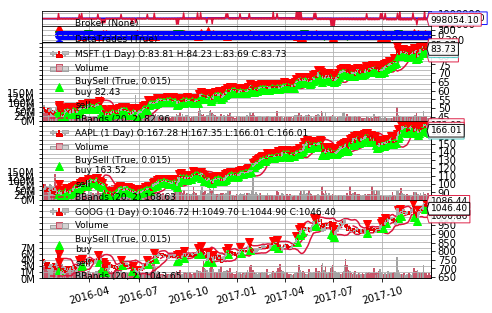

P/L: $551.4999999997672


In [38]:
strat = run()
strat.runstrat()

In [39]:
strat.financesectortest()

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  150222
6: PnL:                                  53.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  150223
6: PnL:                                  -0.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PFG
2: Bar Num:                              24
3: Current date:                         2018-02-05
4: Status:                               Trade Complete
5: Ref:                                  150324
6: PnL:                                  27.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PRU
2: Bar Num:                              24
3: Current date:                         2018-02-05
4: Status:                               Trade Complete
5: Ref:                                  150325
6: PnL:                                  35.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: D

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              28
3: Current date:                         2018-02-09
4: Status:                               Trade Complete
5: Ref:                                  150400
6: PnL:                                  53.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              28
3: Current date:                         2018-02-09
4: Status:                               Trade Complete
5: Ref:                                  150401
6: PnL:                                  -7.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              32
3: Current date:                         2018-02-15
4: Status:                               Trade Complete
5: Ref:                                  150520
6: PnL:                                  -101.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              32
3: Current date:                         2018-02-15
4: Status:                               Trade Complete
5: Ref:                                  150521
6: PnL:                                  8.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            BHF
2: Bar Num:                              35
3: Current date:                         2018-02-21
4: Status:                               Trade Complete
5: Ref:                                  150634
6: PnL:                                  -9.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BK
2: Bar Num:                              35
3: Current date:                         2018-02-21
4: Status:                               Trade Complete
5: Ref:                                  150635
6: PnL:                                  -2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              38
3: Current date:                         2018-02-26
4: Status:                               Trade Complete
5: Ref:                                  150692
6: PnL:                                  -27.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              38
3: Current date:                         2018-02-26
4: Status:                               Trade Complete
5: Ref:                                  150693
6: PnL:                                  5.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BEN
2: Bar Num:                              42
3: Current date:                         2018-03-02
4: Status:                               Trade Complete
5: Ref:                                  150827
6: PnL:                                  -6.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GS
2: Bar Num:                              42
3: Current date:                         2018-03-02
4: Status:                               Trade Complete
5: Ref:                                  150828
6: PnL:                                  74.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Da

---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              45
3: Current date:                         2018-03-07
4: Status:                               Trade Complete
5: Ref:                                  150914
6: PnL:                                  6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              46
3: Current date:                         2018-03-08
4: Status:                               Trade Complete
5: Ref:                                  150915
6: PnL:                                  -19.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              49
3: Current date:                         2018-03-13
4: Status:                               Trade Complete
5: Ref:                                  151021
6: PnL:                                  -0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:                              49
3: Current date:                         2018-03-13
4: Status:                               Trade Complete
5: Ref:                                  151022
6: PnL:                                  0.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:                              51
3: Current date:                         2018-03-15
4: Status:                               Trade Complete
5: Ref:                                  151079
6: PnL:                                  -12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              51
3: Current date:                         2018-03-15
4: Status:                               Trade Complete
5: Ref:                                  151080
6: PnL:                                  -2.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:               

5: Ref:                                  151166
6: PnL:                                  -0.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ICE
2: Bar Num:                              54
3: Current date:                         2018-03-20
4: Status:                               Trade Complete
5: Ref:                                  151167
6: PnL:                                  1.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IVZ
2: Bar Num:                              54
3: Current date:                         2018-03-20
4: Status:                               Trade Complete
5: Ref:                                  151168
6: PnL:                                  -3.0
-------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:                              57
3: Current date:                         2018-03-23
4: Status:                               Trade Complete
5: Ref:                                  151255
6: PnL:                                  15.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              57
3: Current date:                         2018-03-23
4: Status:                               Trade Complete
5: Ref:                                  151256
6: PnL:                                  9.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                 

6: PnL:                                  24.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CB
2: Bar Num:                              60
3: Current date:                         2018-03-28
4: Status:                               Trade Complete
5: Ref:                                  151335
6: PnL:                                  1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CINF
2: Bar Num:                              60
3: Current date:                         2018-03-28
4: Status:                               Trade Complete
5: Ref:                                  151336
6: PnL:                                  0.7
--------------------------------------------------------------------
---------------------------- 

5: Ref:                                  151435
6: PnL:                                  9.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TMK
2: Bar Num:                              62
3: Current date:                         2018-04-02
4: Status:                               Trade Complete
5: Ref:                                  151436
6: PnL:                                  -1.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            USB
2: Bar Num:                              62
3: Current date:                         2018-04-02
4: Status:                               Trade Complete
5: Ref:                                  151437
6: PnL:                                  2.4
--------------------------------------------------

6: PnL:                                  0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CMA
2: Bar Num:                              66
3: Current date:                         2018-04-06
4: Status:                               Trade Complete
5: Ref:                                  151521
6: PnL:                                  8.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DFS
2: Bar Num:                              66
3: Current date:                         2018-04-06
4: Status:                               Trade Complete
5: Ref:                                  151522
6: PnL:                                  7.6
--------------------------------------------------------------------
---------------------------- T

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              70
3: Current date:                         2018-04-12
4: Status:                               Trade Complete
5: Ref:                                  151615
6: PnL:                                  7.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              70
3: Current date:                         2018-04-12
4: Status:                               Trade Complete
5: Ref:                                  151616
6: PnL:                                  4.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                   

---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              73
3: Current date:                         2018-04-17
4: Status:                               Trade Complete
5: Ref:                                  151725
6: PnL:                                  -8.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              74
3: Current date:                         2018-04-18
4: Status:                               Trade Complete
5: Ref:                                  151726
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COF
2: Bar Num:                              76
3: Current date:                         2018-04-20
4: Status:                               Trade Complete
5: Ref:                                  151794
6: PnL:                                  -13.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBOE
2: Bar Num:                              76
3: Current date:                         2018-04-20
4: Status:                               Trade Complete
5: Ref:                                  151795
6: PnL:                                  -11.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              79
3: Current date:                         2018-04-25
4: Status:                               Trade Complete
5: Ref:                                  151899
6: PnL:                                  -1.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              79
3: Current date:                         2018-04-25
4: Status:                               Trade Complete
5: Ref:                                  151900
6: PnL:                                  16.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              83
3: Current date:                         2018-05-01
4: Status:                               Trade Complete
5: Ref:                                  152017
6: PnL:                                  6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              83
3: Current date:                         2018-05-01
4: Status:                               Trade Complete
5: Ref:                                  152018
6: PnL:                                  7.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                   

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RE
2: Bar Num:                              86
3: Current date:                         2018-05-04
4: Status:                               Trade Complete
5: Ref:                                  152098
6: PnL:                                  49.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FITB
2: Bar Num:                              86
3: Current date:                         2018-05-04
4: Status:                               Trade Complete
5: Ref:                                  152099
6: PnL:                                  -5.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: D

---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              89
3: Current date:                         2018-05-09
4: Status:                               Trade Complete
5: Ref:                                  152189
6: PnL:                                  -5.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              90
3: Current date:                         2018-05-10
4: Status:                               Trade Complete
5: Ref:                                  152190
6: PnL:                                  -2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                 

6: PnL:                                  -5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RF
2: Bar Num:                              92
3: Current date:                         2018-05-14
4: Status:                               Trade Complete
5: Ref:                                  152293
6: PnL:                                  -0.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SPGI
2: Bar Num:                              92
3: Current date:                         2018-05-14
4: Status:                               Trade Complete
5: Ref:                                  152294
6: PnL:                                  -4.7
--------------------------------------------------------------------
---------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              96
3: Current date:                         2018-05-18
4: Status:                               Trade Complete
5: Ref:                                  152364
6: PnL:                                  -15.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              96
3: Current date:                         2018-05-18
4: Status:                               Trade Complete
5: Ref:                                  152365
6: PnL:                                  2.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              99
3: Current date:                         2018-05-23
4: Status:                               Trade Complete
5: Ref:                                  152480
6: PnL:                                  -3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              99
3: Current date:                         2018-05-23
4: Status:                               Trade Complete
5: Ref:                                  152481
6: PnL:                                  -0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                   

6: PnL:                                  -1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BHF
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  152553
6: PnL:                                  -4.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COF
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  152554
6: PnL:                                  16.6
--------------------------------------------------------------------
-------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              105
3: Current date:                         2018-06-01
4: Status:                               Trade Complete
5: Ref:                                  152662
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              105
3: Current date:                         2018-06-01
4: Status:                               Trade Complete
5: Ref:                                  152663
6: PnL:                                  7.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                   

5: Ref:                                  152781
6: PnL:                                  -3.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            USB
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  152782
6: PnL:                                  5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UNM
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  152783
6: PnL:                                  1.5
------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              111
3: Current date:                         2018-06-11
4: Status:                               Trade Complete
5: Ref:                                  152847
6: PnL:                                  11.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              111
3: Current date:                         2018-06-11
4: Status:                               Trade Complete
5: Ref:                                  152848
6: PnL:                                  4.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                  

1: Data Name:                            NDAQ
2: Bar Num:                              114
3: Current date:                         2018-06-14
4: Status:                               Trade Complete
5: Ref:                                  152950
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NAVI
2: Bar Num:                              114
3: Current date:                         2018-06-14
4: Status:                               Trade Complete
5: Ref:                                  152951
6: PnL:                                  -4.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTRS
2: Bar Num:                              114
3: Current date:                         2018-0

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              118
3: Current date:                         2018-06-20
4: Status:                               Trade Complete
5: Ref:                                  153033
6: PnL:                                  -32.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              118
3: Current date:                         2018-06-20
4: Status:                               Trade Complete
5: Ref:                                  153034
6: PnL:                                  0.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:               

4: Status:                               Trade Complete
5: Ref:                                  153112
6: PnL:                                  -17.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CMA
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  153113
6: PnL:                                  -17.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DFS
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  153114
6: PnL:                           

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              123
3: Current date:                         2018-06-27
4: Status:                               Trade Complete
5: Ref:                                  153214
6: PnL:                                  -6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              123
3: Current date:                         2018-06-27
4: Status:                               Trade Complete
5: Ref:                                  153215
6: PnL:                                  -2.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                

4: Status:                               Trade Complete
5: Ref:                                  153312
6: PnL:                                  10.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IVZ
2: Bar Num:                              126
3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                                  153313
6: PnL:                                  -4.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            JPM
2: Bar Num:                              126
3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                                  153314
6: PnL:                             

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SYF
2: Bar Num:                              128
3: Current date:                         2018-07-05
4: Status:                               Trade Complete
5: Ref:                                  153400
6: PnL:                                  -0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TROW
2: Bar Num:                              128
3: Current date:                         2018-07-05
4: Status:                               Trade Complete
5: Ref:                                  153401
6: PnL:                                  6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Trade Complete
5: Ref:                                  153481
6: PnL:                                  17.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBOE
2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Trade Complete
5: Ref:                                  153482
6: PnL:                                  15.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CB
2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Tr

6: PnL:                                  -1.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PGR
2: Bar Num:                              134
3: Current date:                         2018-07-13
4: Status:                               Trade Complete
5: Ref:                                  153570
6: PnL:                                  9.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PRU
2: Bar Num:                              134
3: Current date:                         2018-07-13
4: Status:                               Trade Complete
5: Ref:                                  153571
6: PnL:                                  13.0
--------------------------------------------------------------------
--------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  153647
6: PnL:                                  -2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  153648
6: PnL:                                  3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              142
3: Current date:                         2018-07-25
4: Status:                               Trade Complete
5: Ref:                                  153766
6: PnL:                                  -6.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              142
3: Current date:                         2018-07-25
4: Status:                               Trade Complete
5: Ref:                                  153767
6: PnL:                                  2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              145
3: Current date:                         2018-07-30
4: Status:                               Trade Complete
5: Ref:                                  153885
6: PnL:                                  -4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WFC
2: Bar Num:                              145
3: Current date:                         2018-07-30
4: Status:                               Trade Complete
5: Ref:                                  153886
6: PnL:                                  -4.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              149
3: Current date:                         2018-08-03
4: Status:                               Trade Complete
5: Ref:                                  154006
6: PnL:                                  14.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WFC
2: Bar Num:                              149
3: Current date:                         2018-08-03
4: Status:                               Trade Complete
5: Ref:                                  154007
6: PnL:                                  -9.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:               

1: Data Name:                            GS
2: Bar Num:                              152
3: Current date:                         2018-08-08
4: Status:                               Trade Complete
5: Ref:                                  154095
6: PnL:                                  -8.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HBAN
2: Bar Num:                              152
3: Current date:                         2018-08-08
4: Status:                               Trade Complete
5: Ref:                                  154096
6: PnL:                                  1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ICE
2: Bar Num:                              152
3: Current date:                         2018-08-08

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Trade Complete
5: Ref:                                  154188
6: PnL:                                  3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Trade Complete
5: Ref:                                  154189
6: PnL:                                  -1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              159
3: Current date:                         2018-08-17
4: Status:                               Trade Complete
5: Ref:                                  154308
6: PnL:                                  3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WFC
2: Bar Num:                              159
3: Current date:                         2018-08-17
4: Status:                               Trade Complete
5: Ref:                                  154309
6: PnL:                                  -3.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            CB
2: Bar Num:                              162
3: Current date:                         2018-08-22
4: Status:                               Trade Complete
5: Ref:                                  154383
6: PnL:                                  1.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CINF
2: Bar Num:                              162
3: Current date:                         2018-08-22
4: Status:                               Trade Complete
5: Ref:                                  154384
6: PnL:                                  -2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            C
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              165
3: Current date:                         2018-08-27
4: Status:                               Trade Complete
5: Ref:                                  154487
6: PnL:                                  3.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              165
3: Current date:                         2018-08-27
4: Status:                               Trade Complete
5: Ref:                                  154488
6: PnL:                                  4.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WFC
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            TMK
2: Bar Num:                              168
3: Current date:                         2018-08-30
4: Status:                               Trade Complete
5: Ref:                                  154607
6: PnL:                                  2.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UNM
2: Bar Num:                              168
3: Current date:                         2018-08-30
4: Status:                               Trade Complete
5: Ref:                                  154608
6: PnL:                                  3.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WLTW
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              172
3: Current date:                         2018-09-06
4: Status:                               Trade Complete
5: Ref:                                  154677
6: PnL:                                  -11.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              172
3: Current date:                         2018-09-06
4: Status:                               Trade Complete
5: Ref:                                  154678
6: PnL:                                  5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:               

2: Bar Num:                              174
3: Current date:                         2018-09-10
4: Status:                               Trade Complete
5: Ref:                                  154761
6: PnL:                                  0.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:                              174
3: Current date:                         2018-09-10
4: Status:                               Trade Complete
5: Ref:                                  154762
6: PnL:                                  6.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RE
2: Bar Num:                              174
3: Current date:                         2018-09-10
4: Status:                               Trad

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              177
3: Current date:                         2018-09-13
4: Status:                               Trade Complete
5: Ref:                                  154863
6: PnL:                                  -1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            L
2: Bar Num:                              177
3: Current date:                         2018-09-13
4: Status:                               Trade Complete
5: Ref:                                  154864
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BK
2: Bar Num:                  

4: Status:                               Trade Complete
5: Ref:                                  154956
6: PnL:                                  -2.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HBAN
2: Bar Num:                              180
3: Current date:                         2018-09-18
4: Status:                               Trade Complete
5: Ref:                                  154957
6: PnL:                                  -0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ICE
2: Bar Num:                              180
3: Current date:                         2018-09-18
4: Status:                               Trade Complete
5: Ref:                                  154958
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              184
3: Current date:                         2018-09-24
4: Status:                               Trade Complete
5: Ref:                                  155052
6: PnL:                                  -7.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              184
3: Current date:                         2018-09-24
4: Status:                               Trade Complete
5: Ref:                                  155053
6: PnL:                                  1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TRV
2: Bar Num:                              186
3: Current date:                         2018-09-26
4: Status:                               Trade Complete
5: Ref:                                  155168
6: PnL:                                  13.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TMK
2: Bar Num:                              186
3: Current date:                         2018-09-26
4: Status:                               Trade Complete
5: Ref:                                  155169
6: PnL:                                  6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: 

4: Status:                               Trade Complete
5: Ref:                                  155262
6: PnL:                                  -2.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IVZ
2: Bar Num:                              190
3: Current date:                         2018-10-02
4: Status:                               Trade Complete
5: Ref:                                  155263
6: PnL:                                  1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            JPM
2: Bar Num:                              190
3: Current date:                         2018-10-02
4: Status:                               Trade Complete
5: Ref:                                  155264
6: PnL:                              

---------------------------- TRADE ---------------------------------
1: Data Name:                            HIG
2: Bar Num:                              193
3: Current date:                         2018-10-05
4: Status:                               Trade Complete
5: Ref:                                  155350
6: PnL:                                  3.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              194
3: Current date:                         2018-10-08
4: Status:                               Trade Complete
5: Ref:                                  155351
6: PnL:                                  37.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                

1: Data Name:                            PBCT
2: Bar Num:                              196
3: Current date:                         2018-10-10
4: Status:                               Trade Complete
5: Ref:                                  155449
6: PnL:                                  -0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PNC
2: Bar Num:                              196
3: Current date:                         2018-10-10
4: Status:                               Trade Complete
5: Ref:                                  155450
6: PnL:                                  1.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PFG
2: Bar Num:                              196
3: Current date:                         2018-10-1

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              200
3: Current date:                         2018-10-16
4: Status:                               Trade Complete
5: Ref:                                  155533
6: PnL:                                  -21.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              200
3: Current date:                         2018-10-16
4: Status:                               Trade Complete
5: Ref:                                  155534
6: PnL:                                  -0.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:              

6: PnL:                                  -3.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SIVB
2: Bar Num:                              202
3: Current date:                         2018-10-18
4: Status:                               Trade Complete
5: Ref:                                  155644
6: PnL:                                  -35.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SYF
2: Bar Num:                              202
3: Current date:                         2018-10-18
4: Status:                               Trade Complete
5: Ref:                                  155645
6: PnL:                                  -1.0
--------------------------------------------------------------------
-----------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              206
3: Current date:                         2018-10-24
4: Status:                               Trade Complete
5: Ref:                                  155711
6: PnL:                                  -2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              206
3: Current date:                         2018-10-24
4: Status:                               Trade Complete
5: Ref:                                  155712
6: PnL:                                  6.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

5: Ref:                                  155824
6: PnL:                                  -0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TRV
2: Bar Num:                              208
3: Current date:                         2018-10-26
4: Status:                               Trade Complete
5: Ref:                                  155825
6: PnL:                                  9.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TMK
2: Bar Num:                              208
3: Current date:                         2018-10-26
4: Status:                               Trade Complete
5: Ref:                                  155826
6: PnL:                                  -7.8
-----------------------------------------------

6: PnL:                                  1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RE
2: Bar Num:                              212
3: Current date:                         2018-11-01
4: Status:                               Trade Complete
5: Ref:                                  155909
6: PnL:                                  27.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FITB
2: Bar Num:                              212
3: Current date:                         2018-11-01
4: Status:                               Trade Complete
5: Ref:                                  155910
6: PnL:                                  -0.2
--------------------------------------------------------------------
--------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              216
3: Current date:                         2018-11-07
4: Status:                               Trade Complete
5: Ref:                                  156001
6: PnL:                                  -15.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              216
3: Current date:                         2018-11-07
4: Status:                               Trade Complete
5: Ref:                                  156002
6: PnL:                                  7.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              220
3: Current date:                         2018-11-13
4: Status:                               Trade Complete
5: Ref:                                  156120
6: PnL:                                  18.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              220
3: Current date:                         2018-11-13
4: Status:                               Trade Complete
5: Ref:                                  156121
6: PnL:                                  -8.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            UNM
2: Bar Num:                              222
3: Current date:                         2018-11-15
4: Status:                               Trade Complete
5: Ref:                                  156234
6: PnL:                                  -19.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WLTW
2: Bar Num:                              222
3: Current date:                         2018-11-15
4: Status:                               Trade Complete
5: Ref:                                  156235
6: PnL:                                  17.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              227
3: Current date:                         2018-11-23
4: Status:                               Trade Complete
5: Ref:                                  156358
6: PnL:                                  -5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HIG
2: Bar Num:                              227
3: Current date:                         2018-11-23
4: Status:                               Trade Complete
5: Ref:                                  156359
6: PnL:                                  -1.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:               

4: Status:                               Trade Complete
5: Ref:                                  156442
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CFG
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  156443
6: PnL:                                  -0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CME
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  156444
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              233
3: Current date:                         2018-12-03
4: Status:                               Trade Complete
5: Ref:                                  156546
6: PnL:                                  17.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HIG
2: Bar Num:                              233
3: Current date:                         2018-12-03
4: Status:                               Trade Complete
5: Ref:                                  156547
6: PnL:                                  7.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              237
3: Current date:                         2018-12-10
4: Status:                               Trade Complete
5: Ref:                                  156671
6: PnL:                                  -13.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HIG
2: Bar Num:                              237
3: Current date:                         2018-12-10
4: Status:                               Trade Complete
5: Ref:                                  156672
6: PnL:                                  -6.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              240
3: Current date:                         2018-12-13
4: Status:                               Trade Complete
5: Ref:                                  156736
6: PnL:                                  -7.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              240
3: Current date:                         2018-12-13
4: Status:                               Trade Complete
5: Ref:                                  156737
6: PnL:                                  13.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              243
3: Current date:                         2018-12-18
4: Status:                               Trade Complete
5: Ref:                                  156851
6: PnL:                                  1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HIG
2: Bar Num:                              243
3: Current date:                         2018-12-18
4: Status:                               Trade Complete
5: Ref:                                  156852
6: PnL:                                  8.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:                              247
3: Current date:                         2018-12-24
4: Status:                               Trade Complete
5: Ref:                                  156963
6: PnL:                                  -7.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              248
3: Current date:                         2018-12-26
4: Status:                               Trade Complete
5: Ref:                                  156964
6: PnL:                                  12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            JPM
2: Bar Num:                              250
3: Current date:                         2018-12-28
4: Status:                               Trade Complete
5: Ref:                                  157042
6: PnL:                                  -30.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            KEY
2: Bar Num:                              250
3: Current date:                         2018-12-28
4: Status:                               Trade Complete
5: Ref:                                  157043
6: PnL:                                  3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MTB
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  157118
6: PnL:                                  -6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  157119
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              257
3: Current date:                         2019-01-09
4: Status:                               Trade Complete
5: Ref:                                  157225
6: PnL:                                  0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BBT
2: Bar Num:                              257
3: Current date:                         2019-01-09
4: Status:                               Trade Complete
5: Ref:                                  157226
6: PnL:                                  -0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AFL
2: Bar Num:                              261
3: Current date:                         2019-01-15
4: Status:                               Trade Complete
5: Ref:                                  157345
6: PnL:                                  -4.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BBT
2: Bar Num:                              261
3: Current date:                         2019-01-15
4: Status:                               Trade Complete
5: Ref:                                  157346
6: PnL:                                  -8.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              264
3: Current date:                         2019-01-18
4: Status:                               Trade Complete
5: Ref:                                  157412
6: PnL:                                  -18.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              264
3: Current date:                         2019-01-18
4: Status:                               Trade Complete
5: Ref:                                  157413
6: PnL:                                  -5.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            BBT
2: Bar Num:                              267
3: Current date:                         2019-01-24
4: Status:                               Trade Complete
5: Ref:                                  157527
6: PnL:                                  2.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ETFC
2: Bar Num:                              267
3: Current date:                         2019-01-24
4: Status:                               Trade Complete
5: Ref:                                  157528
6: PnL:                                  11.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LNC
2: Bar Num:               

6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MMC
2: Bar Num:                              270
3: Current date:                         2019-01-29
4: Status:                               Trade Complete
5: Ref:                                  157620
6: PnL:                                  -0.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCO
2: Bar Num:                              270
3: Current date:                         2019-01-29
4: Status:                               Trade Complete
5: Ref:                                  157621
6: PnL:                                  -8.6
--------------------------------------------------------------------
-------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            COF
2: Bar Num:                              274
3: Current date:                         2019-02-04
4: Status:                               Trade Complete
5: Ref:                                  157710
6: PnL:                                  0.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBOE
2: Bar Num:                              274
3: Current date:                         2019-02-04
4: Status:                               Trade Complete
5: Ref:                                  157711
6: PnL:                                  -11.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CB
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              278
3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                                  157808
6: PnL:                                  7.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              278
3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                                  157809
6: PnL:                                  5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:                 

4: Status:                               Trade Complete
5: Ref:                                  157867
6: PnL:                                  -11.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AON
2: Bar Num:                              280
3: Current date:                         2019-02-12
4: Status:                               Trade Complete
5: Ref:                                  157868
6: PnL:                                  -28.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AJG
2: Bar Num:                              280
3: Current date:                         2019-02-12
4: Status:                               Trade Complete
5: Ref:                                  157869
6: PnL:                           

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              283
3: Current date:                         2019-02-15
4: Status:                               Trade Complete
5: Ref:                                  157976
6: PnL:                                  -14.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LNC
2: Bar Num:                              283
3: Current date:                         2019-02-15
4: Status:                               Trade Complete
5: Ref:                                  157977
6: PnL:                                  -7.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MS
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              287
3: Current date:                         2019-02-22
4: Status:                               Trade Complete
5: Ref:                                  158094
6: PnL:                                  -0.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BBT
2: Bar Num:                              287
3: Current date:                         2019-02-22
4: Status:                               Trade Complete
5: Ref:                                  158095
6: PnL:                                  -1.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              290
3: Current date:                         2019-02-27
4: Status:                               Trade Complete
5: Ref:                                  158161
6: PnL:                                  -8.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              290
3: Current date:                         2019-02-27
4: Status:                               Trade Complete
5: Ref:                                  158162
6: PnL:                                  8.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:                

5: Ref:                                  158281
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AJG
2: Bar Num:                              294
3: Current date:                         2019-03-05
4: Status:                               Trade Complete
5: Ref:                                  158282
6: PnL:                                  6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIZ
2: Bar Num:                              294
3: Current date:                         2019-03-05
4: Status:                               Trade Complete
5: Ref:                                  158283
6: PnL:                                  11.2
------------------------------------------------

5: Ref:                                  158345
6: PnL:                                  15.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CB
2: Bar Num:                              296
3: Current date:                         2019-03-07
4: Status:                               Trade Complete
5: Ref:                                  158346
6: PnL:                                  6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CINF
2: Bar Num:                              296
3: Current date:                         2019-03-07
4: Status:                               Trade Complete
5: Ref:                                  158347
6: PnL:                                  7.3
------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              299
3: Current date:                         2019-03-12
4: Status:                               Trade Complete
5: Ref:                                  158446
6: PnL:                                  3.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              299
3: Current date:                         2019-03-12
4: Status:                               Trade Complete
5: Ref:                                  158447
6: PnL:                                  1.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LNC
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              303
3: Current date:                         2019-03-18
4: Status:                               Trade Complete
5: Ref:                                  158563
6: PnL:                                  6.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              303
3: Current date:                         2019-03-18
4: Status:                               Trade Complete
5: Ref:                                  158564
6: PnL:                                  4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LNC
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            WLTW
2: Bar Num:                              306
3: Current date:                         2019-03-21
4: Status:                               Trade Complete
5: Ref:                                  158679
6: PnL:                                  12.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              307
3: Current date:                         2019-03-22
4: Status:                               Trade Complete
5: Ref:                                  158680
6: PnL:                                  4.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  158745
6: PnL:                                  -19.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  158746
6: PnL:                                  0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            AIG
2: Bar Num:                              313
3: Current date:                         2019-04-01
4: Status:                               Trade Complete
5: Ref:                                  158853
6: PnL:                                  0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              313
3: Current date:                         2019-04-01
4: Status:                               Trade Complete
5: Ref:                                  158854
6: PnL:                                  1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LNC
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              318
3: Current date:                         2019-04-08
4: Status:                               Trade Complete
5: Ref:                                  158964
6: PnL:                                  -9.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              318
3: Current date:                         2019-04-08
4: Status:                               Trade Complete
5: Ref:                                  158965
6: PnL:                                  7.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            LNC
2: Bar Num:                              321
3: Current date:                         2019-04-11
4: Status:                               Trade Complete
5: Ref:                                  159070
6: PnL:                                  -13.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PFG
2: Bar Num:                              321
3: Current date:                         2019-04-11
4: Status:                               Trade Complete
5: Ref:                                  159071
6: PnL:                                  -11.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:             

1: Data Name:                            CB
2: Bar Num:                              324
3: Current date:                         2019-04-16
4: Status:                               Trade Complete
5: Ref:                                  159140
6: PnL:                                  -3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CINF
2: Bar Num:                              324
3: Current date:                         2019-04-16
4: Status:                               Trade Complete
5: Ref:                                  159141
6: PnL:                                  0.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            C
2: Bar Num:                              324
3: Current date:                         2019-04-16
4

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  159243
6: PnL:                                  0.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  159244
6: PnL:                                  -5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:                

4: Status:                               Trade Complete
5: Ref:                                  159353
6: PnL:                                  14.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SCHW
2: Bar Num:                              331
3: Current date:                         2019-04-26
4: Status:                               Trade Complete
5: Ref:                                  159354
6: PnL:                                  3.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HIG
2: Bar Num:                              331
3: Current date:                         2019-04-26
4: Status:                               Trade Complete
5: Ref:                                  159355
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMG
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  159421
6: PnL:                                  17.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALL
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  159422
6: PnL:                                  -11.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AXP
2: Bar Num:              

In [40]:
strat.healthsectortest()

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              31
3: Current date:                         2018-02-14
4: Status:                               Trade Complete
5: Ref:                                  159484
6: PnL:                                  1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              31
3: Current date:                         2018-02-14
4: Status:                               Trade Complete
5: Ref:                                  159485
6: PnL:                                  4.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                    

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              35
3: Current date:                         2018-02-21
4: Status:                               Trade Complete
5: Ref:                                  159588
6: PnL:                                  -6.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              35
3: Current date:                         2018-02-21
4: Status:                               Trade Complete
5: Ref:                                  159589
6: PnL:                                  -7.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:               

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UNH
2: Bar Num:                              37
3: Current date:                         2018-02-23
4: Status:                               Trade Complete
5: Ref:                                  159684
6: PnL:                                  -15.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UHS
2: Bar Num:                              37
3: Current date:                         2018-02-23
4: Status:                               Trade Complete
5: Ref:                                  159685
6: PnL:                                  -17.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

5: Ref:                                  159768
6: PnL:                                  14.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ILMN
2: Bar Num:                              41
3: Current date:                         2018-03-01
4: Status:                               Trade Complete
5: Ref:                                  159769
6: PnL:                                  38.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              41
3: Current date:                         2018-03-01
4: Status:                               Trade Complete
5: Ref:                                  159770
6: PnL:                                  16.7
----------------------------------------------

6: PnL:                                  -6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MTD
2: Bar Num:                              45
3: Current date:                         2018-03-07
4: Status:                               Trade Complete
5: Ref:                                  159878
6: PnL:                                  21.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MYL
2: Bar Num:                              45
3: Current date:                         2018-03-07
4: Status:                               Trade Complete
5: Ref:                                  159879
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              49
3: Current date:                         2018-03-13
4: Status:                               Trade Complete
5: Ref:                                  159946
6: PnL:                                  2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              49
3: Current date:                         2018-03-13
4: Status:                               Trade Complete
5: Ref:                                  159947
6: PnL:                                  1.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                    

1: Data Name:                            DVA
2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Trade Complete
5: Ref:                                  160048
6: PnL:                                  -7.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Trade Complete
5: Ref:                                  160049
6: PnL:                                  30.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              53
3: Current date:                         2018-03-19


---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              55
3: Current date:                         2018-03-21
4: Status:                               Trade Complete
5: Ref:                                  160105
6: PnL:                                  2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              55
3: Current date:                         2018-03-21
4: Status:                               Trade Complete
5: Ref:                                  160106
6: PnL:                                  -1.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                   

---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              58
3: Current date:                         2018-03-26
4: Status:                               Trade Complete
5: Ref:                                  160215
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              58
3: Current date:                         2018-03-26
4: Status:                               Trade Complete
5: Ref:                                  160216
6: PnL:                                  5.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              61
3: Current date:                         2018-03-29
4: Status:                               Trade Complete
5: Ref:                                  160272
6: PnL:                                  -9.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              61
3: Current date:                         2018-03-29
4: Status:                               Trade Complete
5: Ref:                                  160273
6: PnL:                                  -22.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                              63
3: Current date:                         2018-04-03
4: Status:                               Trade Complete
5: Ref:                                  160330
6: PnL:                                  69.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AGN
2: Bar Num:                              63
3: Current date:                         2018-04-03
4: Status:                               Trade Complete
5: Ref:                                  160331
6: PnL:                                  40.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AGN
2: Bar Num:                              65
3: Current date:                         2018-04-05
4: Status:                               Trade Complete
5: Ref:                                  160385
6: PnL:                                  -38.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMGN
2: Bar Num:                              65
3: Current date:                         2018-04-05
4: Status:                               Trade Complete
5: Ref:                                  160386
6: PnL:                                  -76.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

5: Ref:                                  160480
6: PnL:                                  22.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UNH
2: Bar Num:                              67
3: Current date:                         2018-04-09
4: Status:                               Trade Complete
5: Ref:                                  160481
6: PnL:                                  10.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UHS
2: Bar Num:                              67
3: Current date:                         2018-04-09
4: Status:                               Trade Complete
5: Ref:                                  160482
6: PnL:                                  19.9
------------------------------------------------

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BSX
2: Bar Num:                              71
3: Current date:                         2018-04-13
4: Status:                               Trade Complete
5: Ref:                                  160558
6: PnL:                                  -0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BMY
2: Bar Num:                              71
3: Current date:                         2018-04-13
4: Status:                               Trade Complete
5: Ref:                                  160559
6: PnL:                                  -1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: D

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EW
2: Bar Num:                              73
3: Current date:                         2018-04-17
4: Status:                               Trade Complete
5: Ref:                                  160622
6: PnL:                                  0.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GILD
2: Bar Num:                              73
3: Current date:                         2018-04-17
4: Status:                               Trade Complete
5: Ref:                                  160623
6: PnL:                                  -8.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Da

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              77
3: Current date:                         2018-04-23
4: Status:                               Trade Complete
5: Ref:                                  160715
6: PnL:                                  -5.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              77
3: Current date:                         2018-04-23
4: Status:                               Trade Complete
5: Ref:                                  160716
6: PnL:                                  4.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                   

6: PnL:                                  1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CERN
2: Bar Num:                              79
3: Current date:                         2018-04-25
4: Status:                               Trade Complete
5: Ref:                                  160787
6: PnL:                                  -11.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CI
2: Bar Num:                              79
3: Current date:                         2018-04-25
4: Status:                               Trade Complete
5: Ref:                                  160788
6: PnL:                                  7.6
--------------------------------------------------------------------
----------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              82
3: Current date:                         2018-04-30
4: Status:                               Trade Complete
5: Ref:                                  160879
6: PnL:                                  6.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              82
3: Current date:                         2018-04-30
4: Status:                               Trade Complete
5: Ref:                                  160880
6: PnL:                                  5.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                 

5: Ref:                                  160942
6: PnL:                                  30.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                              85
3: Current date:                         2018-05-03
4: Status:                               Trade Complete
5: Ref:                                  160943
6: PnL:                                  14.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AGN
2: Bar Num:                              85
3: Current date:                         2018-05-03
4: Status:                               Trade Complete
5: Ref:                                  160944
6: PnL:                                  13.2
-----------------------------------------------

1: Data Name:                            PKI
2: Bar Num:                              87
3: Current date:                         2018-05-07
4: Status:                               Trade Complete
5: Ref:                                  161032
6: PnL:                                  10.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PFE
2: Bar Num:                              87
3: Current date:                         2018-05-07
4: Status:                               Trade Complete
5: Ref:                                  161033
6: PnL:                                  2.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DGX
2: Bar Num:                              78
3: Current date:                         2018-05-07
4:

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              91
3: Current date:                         2018-05-11
4: Status:                               Trade Complete
5: Ref:                                  161106
6: PnL:                                  5.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              91
3: Current date:                         2018-05-11
4: Status:                               Trade Complete
5: Ref:                                  161107
6: PnL:                                  -8.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                   

1: Data Name:                            A
2: Bar Num:                              93
3: Current date:                         2018-05-15
4: Status:                               Trade Complete
5: Ref:                                  161162
6: PnL:                                  -78.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              93
3: Current date:                         2018-05-15
4: Status:                               Trade Complete
5: Ref:                                  161163
6: PnL:                                  -18.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                              93
3: Current date:                         2018-05-15

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              97
3: Current date:                         2018-05-21
4: Status:                               Trade Complete
5: Ref:                                  161264
6: PnL:                                  9.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              97
3: Current date:                         2018-05-21
4: Status:                               Trade Complete
5: Ref:                                  161265
6: PnL:                                  -16.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                  

2: Bar Num:                              99
3: Current date:                         2018-05-23
4: Status:                               Trade Complete
5: Ref:                                  161329
6: PnL:                                  -5.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BMY
2: Bar Num:                              99
3: Current date:                         2018-05-23
4: Status:                               Trade Complete
5: Ref:                                  161330
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CAH
2: Bar Num:                              99
3: Current date:                         2018-05-23
4: Status:                               Trade 

---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  161420
6: PnL:                                  -13.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  161421
6: PnL:                                  -6.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              105
3: Current date:                         2018-06-01
4: Status:                               Trade Complete
5: Ref:                                  161478
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              105
3: Current date:                         2018-06-01
4: Status:                               Trade Complete
5: Ref:                                  161479
6: PnL:                                  28.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  161582
6: PnL:                                  -7.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  161583
6: PnL:                                  8.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              111
3: Current date:                         2018-06-11
4: Status:                               Trade Complete
5: Ref:                                  161642
6: PnL:                                  2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              111
3: Current date:                         2018-06-11
4: Status:                               Trade Complete
5: Ref:                                  161643
6: PnL:                                  -12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                

4: Status:                               Trade Complete
5: Ref:                                  161734
6: PnL:                                  -0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            REGN
2: Bar Num:                              113
3: Current date:                         2018-06-13
4: Status:                               Trade Complete
5: Ref:                                  161735
6: PnL:                                  15.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RMD
2: Bar Num:                              113
3: Current date:                         2018-06-13
4: Status:                               Trade Complete
5: Ref:                                  161736
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              116
3: Current date:                         2018-06-18
4: Status:                               Trade Complete
5: Ref:                                  161801
6: PnL:                                  -13.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              116
3: Current date:                         2018-06-18
4: Status:                               Trade Complete
5: Ref:                                  161802
6: PnL:                                  -9.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:             

6: PnL:                                  12.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TMO
2: Bar Num:                              119
3: Current date:                         2018-06-21
4: Status:                               Trade Complete
5: Ref:                                  161905
6: PnL:                                  10.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UNH
2: Bar Num:                              119
3: Current date:                         2018-06-21
4: Status:                               Trade Complete
5: Ref:                                  161906
6: PnL:                                  3.7
--------------------------------------------------------------------
--------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              122
3: Current date:                         2018-06-26
4: Status:                               Trade Complete
5: Ref:                                  161967
6: PnL:                                  12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              122
3: Current date:                         2018-06-26
4: Status:                               Trade Complete
5: Ref:                                  161968
6: PnL:                                  0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:               

4: Status:                               Trade Complete
5: Ref:                                  162067
6: PnL:                                  -11.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COO
2: Bar Num:                              125
3: Current date:                         2018-06-29
4: Status:                               Trade Complete
5: Ref:                                  162068
6: PnL:                                  -20.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TMO
2: Bar Num:                              125
3: Current date:                         2018-06-29
4: Status:                               Trade Complete
5: Ref:                                  162069
6: PnL:                           

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              128
3: Current date:                         2018-07-05
4: Status:                               Trade Complete
5: Ref:                                  162129
6: PnL:                                  -8.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              128
3: Current date:                         2018-07-05
4: Status:                               Trade Complete
5: Ref:                                  162130
6: PnL:                                  -6.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              130
3: Current date:                         2018-07-09
4: Status:                               Trade Complete
5: Ref:                                  162184
6: PnL:                                  19.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              130
3: Current date:                         2018-07-09
4: Status:                               Trade Complete
5: Ref:                                  162185
6: PnL:                                  7.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              134
3: Current date:                         2018-07-13
4: Status:                               Trade Complete
5: Ref:                                  162290
6: PnL:                                  -0.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              134
3: Current date:                         2018-07-13
4: Status:                               Trade Complete
5: Ref:                                  162291
6: PnL:                                  12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:             

6: PnL:                                  -43.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ZBH
2: Bar Num:                              137
3: Current date:                         2018-07-18
4: Status:                               Trade Complete
5: Ref:                                  162395
6: PnL:                                  -12.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  162396
6: PnL:                                  19.8
--------------------------------------------------------------------
----------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              141
3: Current date:                         2018-07-24
4: Status:                               Trade Complete
5: Ref:                                  162455
6: PnL:                                  2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              141
3: Current date:                         2018-07-24
4: Status:                               Trade Complete
5: Ref:                                  162456
6: PnL:                                  2.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Trade Complete
5: Ref:                                  162559
6: PnL:                                  5.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Trade Complete
5: Ref:                                  162560
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LLY
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              147
3: Current date:                         2018-08-01
4: Status:                               Trade Complete
5: Ref:                                  162622
6: PnL:                                  -0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              147
3: Current date:                         2018-08-01
4: Status:                               Trade Complete
5: Ref:                                  162623
6: PnL:                                  -6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              150
3: Current date:                         2018-08-06
4: Status:                               Trade Complete
5: Ref:                                  162730
6: PnL:                                  6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              150
3: Current date:                         2018-08-06
4: Status:                               Trade Complete
5: Ref:                                  162731
6: PnL:                                  -15.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LLY
2: Bar Num:              

4: Status:                               Trade Complete
5: Ref:                                  162828
6: PnL:                                  72.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RMD
2: Bar Num:                              153
3: Current date:                         2018-08-09
4: Status:                               Trade Complete
5: Ref:                                  162829
6: PnL:                                  -2.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SYK
2: Bar Num:                              153
3: Current date:                         2018-08-09
4: Status:                               Trade Complete
5: Ref:                                  162830
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              157
3: Current date:                         2018-08-15
4: Status:                               Trade Complete
5: Ref:                                  162896
6: PnL:                                  0.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              157
3: Current date:                         2018-08-15
4: Status:                               Trade Complete
5: Ref:                                  162897
6: PnL:                                  -1.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              160
3: Current date:                         2018-08-20
4: Status:                               Trade Complete
5: Ref:                                  162995
6: PnL:                                  2.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              160
3: Current date:                         2018-08-20
4: Status:                               Trade Complete
5: Ref:                                  162996
6: PnL:                                  17.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LLY
2: Bar Num:               

4: Status:                               Trade Complete
5: Ref:                                  163069
6: PnL:                                  -0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EW
2: Bar Num:                              163
3: Current date:                         2018-08-23
4: Status:                               Trade Complete
5: Ref:                                  163070
6: PnL:                                  -13.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GILD
2: Bar Num:                              163
3: Current date:                         2018-08-23
4: Status:                               Trade Complete
5: Ref:                                  163071
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              167
3: Current date:                         2018-08-29
4: Status:                               Trade Complete
5: Ref:                                  163156
6: PnL:                                  -3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              167
3: Current date:                         2018-08-29
4: Status:                               Trade Complete
5: Ref:                                  163157
6: PnL:                                  3.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              170
3: Current date:                         2018-09-04
4: Status:                               Trade Complete
5: Ref:                                  163259
6: PnL:                                  28.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              170
3: Current date:                         2018-09-04
4: Status:                               Trade Complete
5: Ref:                                  163260
6: PnL:                                  -3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

4: Status:                               Trade Complete
5: Ref:                                  163329
6: PnL:                                  6.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BMY
2: Bar Num:                              173
3: Current date:                         2018-09-07
4: Status:                               Trade Complete
5: Ref:                                  163330
6: PnL:                                  -3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CAH
2: Bar Num:                              173
3: Current date:                         2018-09-07
4: Status:                               Trade Complete
5: Ref:                                  163331
6: PnL:                              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              177
3: Current date:                         2018-09-13
4: Status:                               Trade Complete
5: Ref:                                  163429
6: PnL:                                  6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              177
3: Current date:                         2018-09-13
4: Status:                               Trade Complete
5: Ref:                                  163430
6: PnL:                                  5.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                  

4: Status:                               Trade Complete
5: Ref:                                  163525
6: PnL:                                  22.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COO
2: Bar Num:                              179
3: Current date:                         2018-09-17
4: Status:                               Trade Complete
5: Ref:                                  163526
6: PnL:                                  20.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TMO
2: Bar Num:                              179
3: Current date:                         2018-09-17
4: Status:                               Trade Complete
5: Ref:                                  163527
6: PnL:                             

2: Bar Num:                              183
3: Current date:                         2018-09-21
4: Status:                               Trade Complete
5: Ref:                                  163621
6: PnL:                                  12.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HOLX
2: Bar Num:                              183
3: Current date:                         2018-09-21
4: Status:                               Trade Complete
5: Ref:                                  163622
6: PnL:                                  3.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HUM
2: Bar Num:                              183
3: Current date:                         2018-09-21
4: Status:                               Tr

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              186
3: Current date:                         2018-09-26
4: Status:                               Trade Complete
5: Ref:                                  163704
6: PnL:                                  -7.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              186
3: Current date:                         2018-09-26
4: Status:                               Trade Complete
5: Ref:                                  163705
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              189
3: Current date:                         2018-10-01
4: Status:                               Trade Complete
5: Ref:                                  163767
6: PnL:                                  10.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              189
3: Current date:                         2018-10-01
4: Status:                               Trade Complete
5: Ref:                                  163768
6: PnL:                                  1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                 

2: Bar Num:                              191
3: Current date:                         2018-10-03
4: Status:                               Trade Complete
5: Ref:                                  163840
6: PnL:                                  -2.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XRAY
2: Bar Num:                              191
3: Current date:                         2018-10-03
4: Status:                               Trade Complete
5: Ref:                                  163841
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EW
2: Bar Num:                              191
3: Current date:                         2018-10-03
4: Status:                               Tr

---------------------------- TRADE ---------------------------------
1: Data Name:                            AGN
2: Bar Num:                              193
3: Current date:                         2018-10-05
4: Status:                               Trade Complete
5: Ref:                                  163885
6: PnL:                                  21.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMGN
2: Bar Num:                              193
3: Current date:                         2018-10-05
4: Status:                               Trade Complete
5: Ref:                                  163886
6: PnL:                                  16.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ANTM
2: Bar Num:             

4: Status:                               Trade Complete
5: Ref:                                  163983
6: PnL:                                  14.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              196
3: Current date:                         2018-10-10
4: Status:                               Trade Complete
5: Ref:                                  163984
6: PnL:                                  13.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LLY
2: Bar Num:                              196
3: Current date:                         2018-10-10
4: Status:                               Trade Complete
5: Ref:                                  163985
6: PnL:                            

1: Data Name:                            ABT
2: Bar Num:                              199
3: Current date:                         2018-10-15
4: Status:                               Trade Complete
5: Ref:                                  164044
6: PnL:                                  -0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              199
3: Current date:                         2018-10-15
4: Status:                               Trade Complete
5: Ref:                                  164045
6: PnL:                                  -1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              199
3: Current date:                         2018-10-15

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              201
3: Current date:                         2018-10-17
4: Status:                               Trade Complete
5: Ref:                                  164101
6: PnL:                                  8.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              201
3: Current date:                         2018-10-17
4: Status:                               Trade Complete
5: Ref:                                  164102
6: PnL:                                  19.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                 

1: Data Name:                            LH
2: Bar Num:                              203
3: Current date:                         2018-10-19
4: Status:                               Trade Complete
5: Ref:                                  164186
6: PnL:                                  6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCK
2: Bar Num:                              203
3: Current date:                         2018-10-19
4: Status:                               Trade Complete
5: Ref:                                  164187
6: PnL:                                  20.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MRK
2: Bar Num:                              203
3: Current date:                         2018-10-19


---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              206
3: Current date:                         2018-10-24
4: Status:                               Trade Complete
5: Ref:                                  164260
6: PnL:                                  9.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              206
3: Current date:                         2018-10-24
4: Status:                               Trade Complete
5: Ref:                                  164261
6: PnL:                                  5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LLY
2: Bar Num:                

3: Current date:                         2018-10-29
4: Status:                               Trade Complete
5: Ref:                                  164354
6: PnL:                                  -138.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MYL
2: Bar Num:                              209
3: Current date:                         2018-10-29
4: Status:                               Trade Complete
5: Ref:                                  164355
6: PnL:                                  10.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PKI
2: Bar Num:                              209
3: Current date:                         2018-10-29
4: Status:                               Trade Complete
5: Ref:                       

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              213
3: Current date:                         2018-11-02
4: Status:                               Trade Complete
5: Ref:                                  164430
6: PnL:                                  16.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              213
3: Current date:                         2018-11-02
4: Status:                               Trade Complete
5: Ref:                                  164431
6: PnL:                                  63.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VAR
2: Bar Num:                              215
3: Current date:                         2018-11-06
4: Status:                               Trade Complete
5: Ref:                                  164530
6: PnL:                                  2.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VRTX
2: Bar Num:                              215
3: Current date:                         2018-11-06
4: Status:                               Trade Complete
5: Ref:                                  164531
6: PnL:                                  -31.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  164589
6: PnL:                                  -15.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  164590
6: PnL:                                  -6.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LLY
2: Bar Num:             

4: Status:                               Trade Complete
5: Ref:                                  164657
6: PnL:                                  8.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ANTM
2: Bar Num:                              221
3: Current date:                         2018-11-14
4: Status:                               Trade Complete
5: Ref:                                  164658
6: PnL:                                  11.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BAX
2: Bar Num:                              221
3: Current date:                         2018-11-14
4: Status:                               Trade Complete
5: Ref:                                  164659
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            MTD
2: Bar Num:                              223
3: Current date:                         2018-11-16
4: Status:                               Trade Complete
5: Ref:                                  164739
6: PnL:                                  -123.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MYL
2: Bar Num:                              223
3: Current date:                         2018-11-16
4: Status:                               Trade Complete
5: Ref:                                  164740
6: PnL:                                  5.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PKI
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              226
3: Current date:                         2018-11-21
4: Status:                               Trade Complete
5: Ref:                                  164807
6: PnL:                                  -4.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:                              226
3: Current date:                         2018-11-21
4: Status:                               Trade Complete
5: Ref:                                  164808
6: PnL:                                  -7.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INCY
2: Bar Num:             

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PRGO
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  164921
6: PnL:                                  16.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              231
3: Current date:                         2018-11-29
4: Status:                               Trade Complete
5: Ref:                                  164922
6: PnL:                                  23.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

---------------------------- TRADE ---------------------------------
1: Data Name:                            CERN
2: Bar Num:                              233
3: Current date:                         2018-12-03
4: Status:                               Trade Complete
5: Ref:                                  164991
6: PnL:                                  7.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CI
2: Bar Num:                              233
3: Current date:                         2018-12-03
4: Status:                               Trade Complete
5: Ref:                                  164992
6: PnL:                                  -16.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DHR
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              237
3: Current date:                         2018-12-10
4: Status:                               Trade Complete
5: Ref:                                  165085
6: PnL:                                  -17.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              237
3: Current date:                         2018-12-10
4: Status:                               Trade Complete
5: Ref:                                  165086
6: PnL:                                  -12.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              240
3: Current date:                         2018-12-13
4: Status:                               Trade Complete
5: Ref:                                  165189
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              240
3: Current date:                         2018-12-13
4: Status:                               Trade Complete
5: Ref:                                  165190
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              243
3: Current date:                         2018-12-18
4: Status:                               Trade Complete
5: Ref:                                  165254
6: PnL:                                  4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              243
3: Current date:                         2018-12-18
4: Status:                               Trade Complete
5: Ref:                                  165255
6: PnL:                                  -6.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              246
3: Current date:                         2018-12-21
4: Status:                               Trade Complete
5: Ref:                                  165359
6: PnL:                                  16.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              246
3: Current date:                         2018-12-21
4: Status:                               Trade Complete
5: Ref:                                  165360
6: PnL:                                  -26.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVA
2: Bar Num:             

5: Ref:                                  165451
6: PnL:                                  -24.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LH
2: Bar Num:                              249
3: Current date:                         2018-12-27
4: Status:                               Trade Complete
5: Ref:                                  165452
6: PnL:                                  -16.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCK
2: Bar Num:                              249
3: Current date:                         2018-12-27
4: Status:                               Trade Complete
5: Ref:                                  165453
6: PnL:                                  -14.4
--------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              252
3: Current date:                         2019-01-02
4: Status:                               Trade Complete
5: Ref:                                  165524
6: PnL:                                  22.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              252
3: Current date:                         2019-01-02
4: Status:                               Trade Complete
5: Ref:                                  165525
6: PnL:                                  -3.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DHR
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  165578
6: PnL:                                  -17.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  165579
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DHR
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              257
3: Current date:                         2019-01-09
4: Status:                               Trade Complete
5: Ref:                                  165640
6: PnL:                                  -6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              257
3: Current date:                         2019-01-09
4: Status:                               Trade Complete
5: Ref:                                  165641
6: PnL:                                  6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              260
3: Current date:                         2019-01-14
4: Status:                               Trade Complete
5: Ref:                                  165737
6: PnL:                                  6.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              260
3: Current date:                         2019-01-14
4: Status:                               Trade Complete
5: Ref:                                  165738
6: PnL:                                  3.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DHR
2: Bar Num:                

1: Data Name:                            REGN
2: Bar Num:                              263
3: Current date:                         2019-01-17
4: Status:                               Trade Complete
5: Ref:                                  165831
6: PnL:                                  34.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RMD
2: Bar Num:                              263
3: Current date:                         2019-01-17
4: Status:                               Trade Complete
5: Ref:                                  165832
6: PnL:                                  -2.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SYK
2: Bar Num:                              263
3: Current date:                         2019-01-

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              267
3: Current date:                         2019-01-24
4: Status:                               Trade Complete
5: Ref:                                  165903
6: PnL:                                  -5.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              267
3: Current date:                         2019-01-24
4: Status:                               Trade Complete
5: Ref:                                  165904
6: PnL:                                  -4.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                

3: Current date:                         2019-01-28
4: Status:                               Trade Complete
5: Ref:                                  165990
6: PnL:                                  62.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SYK
2: Bar Num:                              269
3: Current date:                         2019-01-28
4: Status:                               Trade Complete
5: Ref:                                  165991
6: PnL:                                  33.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COO
2: Bar Num:                              269
3: Current date:                         2019-01-28
4: Status:                               Trade Complete
5: Ref:                         

4: Status:                               Trade Complete
5: Ref:                                  166086
6: PnL:                                  1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IDXX
2: Bar Num:                              273
3: Current date:                         2019-02-01
4: Status:                               Trade Complete
5: Ref:                                  166087
6: PnL:                                  -59.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ILMN
2: Bar Num:                              273
3: Current date:                         2019-02-01
4: Status:                               Trade Complete
5: Ref:                                  166088
6: PnL:                           

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              276
3: Current date:                         2019-02-06
4: Status:                               Trade Complete
5: Ref:                                  166168
6: PnL:                                  10.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              276
3: Current date:                         2019-02-06
4: Status:                               Trade Complete
5: Ref:                                  166169
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:             

2: Bar Num:                              279
3: Current date:                         2019-02-11
4: Status:                               Trade Complete
5: Ref:                                  166257
6: PnL:                                  -170.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IQV
2: Bar Num:                              279
3: Current date:                         2019-02-11
4: Status:                               Trade Complete
5: Ref:                                  166258
6: PnL:                                  -0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            JNJ
2: Bar Num:                              279
3: Current date:                         2019-02-11
4: Status:                               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              282
3: Current date:                         2019-02-14
4: Status:                               Trade Complete
5: Ref:                                  166335
6: PnL:                                  1.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              282
3: Current date:                         2019-02-14
4: Status:                               Trade Complete
5: Ref:                                  166336
6: PnL:                                  2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              286
3: Current date:                         2019-02-21
4: Status:                               Trade Complete
5: Ref:                                  166445
6: PnL:                                  -7.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              286
3: Current date:                         2019-02-21
4: Status:                               Trade Complete
5: Ref:                                  166446
6: PnL:                                  -11.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DHR
2: Bar Num:            

1: Data Name:                            HSIC
2: Bar Num:                              289
3: Current date:                         2019-02-26
4: Status:                               Trade Complete
5: Ref:                                  166523
6: PnL:                                  -5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HOLX
2: Bar Num:                              289
3: Current date:                         2019-02-26
4: Status:                               Trade Complete
5: Ref:                                  166524
6: PnL:                                  -8.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HUM
2: Bar Num:                              289
3: Current date:                         2019-02

1: Data Name:                            LLY
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  166603
6: PnL:                                  -17.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NKTR
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  166604
6: PnL:                                  -11.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PRGO
2: Bar Num:                              292
3: Current date:                         2019-

6: PnL:                                  34.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MRK
2: Bar Num:                              295
3: Current date:                         2019-03-06
4: Status:                               Trade Complete
5: Ref:                                  166688
6: PnL:                                  1.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MTD
2: Bar Num:                              295
3: Current date:                         2019-03-06
4: Status:                               Trade Complete
5: Ref:                                  166689
6: PnL:                                  -38.5
--------------------------------------------------------------------
-------------------------

3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  166763
6: PnL:                                  35.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NKTR
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  166764
6: PnL:                                  -4.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PRGO
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                       

4: Status:                               Trade Complete
5: Ref:                                  166837
6: PnL:                                  -23.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GILD
2: Bar Num:                              301
3: Current date:                         2019-03-14
4: Status:                               Trade Complete
5: Ref:                                  166838
6: PnL:                                  4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HCA
2: Bar Num:                              301
3: Current date:                         2019-03-14
4: Status:                               Trade Complete
5: Ref:                                  166839
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              304
3: Current date:                         2019-03-19
4: Status:                               Trade Complete
5: Ref:                                  166922
6: PnL:                                  -10.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              304
3: Current date:                         2019-03-19
4: Status:                               Trade Complete
5: Ref:                                  166923
6: PnL:                                  24.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              308
3: Current date:                         2019-03-25
4: Status:                               Trade Complete
5: Ref:                                  167034
6: PnL:                                  -12.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              308
3: Current date:                         2019-03-25
4: Status:                               Trade Complete
5: Ref:                                  167035
6: PnL:                                  35.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:            

2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  167092
6: PnL:                                  -35.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  167093
6: PnL:                                  -12.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CELG
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                              

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            JNJ
2: Bar Num:                              313
3: Current date:                         2019-04-01
4: Status:                               Trade Complete
5: Ref:                                  167183
6: PnL:                                  -7.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            LH
2: Bar Num:                              313
3: Current date:                         2019-04-01
4: Status:                               Trade Complete
5: Ref:                                  167184
6: PnL:                                  -28.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              317
3: Current date:                         2019-04-05
4: Status:                               Trade Complete
5: Ref:                                  167266
6: PnL:                                  -5.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              317
3: Current date:                         2019-04-05
4: Status:                               Trade Complete
5: Ref:                                  167267
6: PnL:                                  -6.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              319
3: Current date:                         2019-04-09
4: Status:                               Trade Complete
5: Ref:                                  167320
6: PnL:                                  -6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              319
3: Current date:                         2019-04-09
4: Status:                               Trade Complete
5: Ref:                                  167321
6: PnL:                                  -0.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              322
3: Current date:                         2019-04-12
4: Status:                               Trade Complete
5: Ref:                                  167421
6: PnL:                                  -14.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              322
3: Current date:                         2019-04-12
4: Status:                               Trade Complete
5: Ref:                                  167422
6: PnL:                                  29.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              325
3: Current date:                         2019-04-17
4: Status:                               Trade Complete
5: Ref:                                  167484
6: PnL:                                  -17.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              325
3: Current date:                         2019-04-17
4: Status:                               Trade Complete
5: Ref:                                  167485
6: PnL:                                  -26.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  167587
6: PnL:                                  5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  167588
6: PnL:                                  -22.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABBV
2: Bar Num:                              330
3: Current date:                         2019-04-25
4: Status:                               Trade Complete
5: Ref:                                  167643
6: PnL:                                  8.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALXN
2: Bar Num:                              330
3: Current date:                         2019-04-25
4: Status:                               Trade Complete
5: Ref:                                  167644
6: PnL:                                  10.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ABC
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ABT
2: Bar Num:                              333
3: Current date:                         2019-04-30
4: Status:                               Trade Complete
5: Ref:                                  167708
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            A
2: Bar Num:                              333
3: Current date:                         2019-04-30
4: Status:                               Trade Complete
5: Ref:                                  167709
6: PnL:                                  -0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ALGN
2: Bar Num:                

In [41]:
strat.itsectortest()

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  167813
6: PnL:                                  -0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  167814
6: PnL:                                  -19.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              26
3: Current date:                         2018-02-07
4: Status:                               Trade Complete
5: Ref:                                  167946
6: PnL:                                  -38.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              26
3: Current date:                         2018-02-07
4: Status:                               Trade Complete
5: Ref:                                  167947
6: PnL:                                  35.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              28
3: Current date:                         2018-02-09
4: Status:                               Trade Complete
5: Ref:                                  168014
6: PnL:                                  35.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              28
3: Current date:                         2018-02-09
4: Status:                               Trade Complete
5: Ref:                                  168015
6: PnL:                                  55.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:                

3: Current date:                         2018-02-13
4: Status:                               Trade Complete
5: Ref:                                  168111
6: PnL:                                  0.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTU
2: Bar Num:                              30
3: Current date:                         2018-02-13
4: Status:                               Trade Complete
5: Ref:                                  168112
6: PnL:                                  22.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IPGP
2: Bar Num:                              30
3: Current date:                         2018-02-13
4: Status:                               Trade Complete
5: Ref:                          

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XRX
2: Bar Num:                              32
3: Current date:                         2018-02-15
4: Status:                               Trade Complete
5: Ref:                                  168204
6: PnL:                                  9.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              33
3: Current date:                         2018-02-16
4: Status:                               Trade Complete
5: Ref:                                  168205
6: PnL:                                  -11.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              36
3: Current date:                         2018-02-22
4: Status:                               Trade Complete
5: Ref:                                  168273
6: PnL:                                  4.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              36
3: Current date:                         2018-02-22
4: Status:                               Trade Complete
5: Ref:                                  168274
6: PnL:                                  13.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:                 

2: Bar Num:                              38
3: Current date:                         2018-02-26
4: Status:                               Trade Complete
5: Ref:                                  168374
6: PnL:                                  -42.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MA
2: Bar Num:                              38
3: Current date:                         2018-02-26
4: Status:                               Trade Complete
5: Ref:                                  168375
6: PnL:                                  -25.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:                              38
3: Current date:                         2018-02-26
4: Status:                               Tra

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              41
3: Current date:                         2018-03-01
4: Status:                               Trade Complete
5: Ref:                                  168465
6: PnL:                                  7.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PYPL
2: Bar Num:                              41
3: Current date:                         2018-03-01
4: Status:                               Trade Complete
5: Ref:                                  168466
6: PnL:                                  3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WDC
2: Bar Num:                 

1: Data Name:                            ACN
2: Bar Num:                              44
3: Current date:                         2018-03-06
4: Status:                               Trade Complete
5: Ref:                                  168534
6: PnL:                                  -19.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              44
3: Current date:                         2018-03-06
4: Status:                               Trade Complete
5: Ref:                                  168535
6: PnL:                                  -17.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              44
3: Current date:                         2018-03-

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HPQ
2: Bar Num:                              46
3: Current date:                         2018-03-08
4: Status:                               Trade Complete
5: Ref:                                  168629
6: PnL:                                  3.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTC
2: Bar Num:                              46
3: Current date:                         2018-03-08
4: Status:                               Trade Complete
5: Ref:                                  168630
6: PnL:                                  15.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: D

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              49
3: Current date:                         2018-03-13
4: Status:                               Trade Complete
5: Ref:                                  168728
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PYPL
2: Bar Num:                              49
3: Current date:                         2018-03-13
4: Status:                               Trade Complete
5: Ref:                                  168729
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WDC
2: Bar Num:                 

2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Trade Complete
5: Ref:                                  168804
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Trade Complete
5: Ref:                                  168805
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMAT
2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Tra

6: PnL:                                  15.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CRM
2: Bar Num:                              54
3: Current date:                         2018-03-20
4: Status:                               Trade Complete
5: Ref:                                  168911
6: PnL:                                  4.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            STX
2: Bar Num:                              54
3: Current date:                         2018-03-20
4: Status:                               Trade Complete
5: Ref:                                  168912
6: PnL:                                  8.5
--------------------------------------------------------------------
---------------------------- 

5: Ref:                                  168985
6: PnL:                                  23.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            V
2: Bar Num:                              56
3: Current date:                         2018-03-22
4: Status:                               Trade Complete
5: Ref:                                  168986
6: PnL:                                  26.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WU
2: Bar Num:                              56
3: Current date:                         2018-03-22
4: Status:                               Trade Complete
5: Ref:                                  168987
6: PnL:                                  -2.9
---------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              59
3: Current date:                         2018-03-27
4: Status:                               Trade Complete
5: Ref:                                  169054
6: PnL:                                  12.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              59
3: Current date:                         2018-03-27
4: Status:                               Trade Complete
5: Ref:                                  169055
6: PnL:                                  -16.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:             

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CDNS
2: Bar Num:                              62
3: Current date:                         2018-04-02
4: Status:                               Trade Complete
5: Ref:                                  169138
6: PnL:                                  2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CSCO
2: Bar Num:                              62
3: Current date:                         2018-04-02
4: Status:                               Trade Complete
5: Ref:                                  169139
6: PnL:                                  5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: D

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              65
3: Current date:                         2018-04-05
4: Status:                               Trade Complete
5: Ref:                                  169253
6: PnL:                                  32.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              65
3: Current date:                         2018-04-05
4: Status:                               Trade Complete
5: Ref:                                  169254
6: PnL:                                  -24.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              67
3: Current date:                         2018-04-09
4: Status:                               Trade Complete
5: Ref:                                  169318
6: PnL:                                  -6.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              67
3: Current date:                         2018-04-09
4: Status:                               Trade Complete
5: Ref:                                  169319
6: PnL:                                  8.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:               

5: Ref:                                  169417
6: PnL:                                  2.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTC
2: Bar Num:                              70
3: Current date:                         2018-04-12
4: Status:                               Trade Complete
5: Ref:                                  169418
6: PnL:                                  4.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IBM
2: Bar Num:                              70
3: Current date:                         2018-04-12
4: Status:                               Trade Complete
5: Ref:                                  169419
6: PnL:                                  -22.7
------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              73
3: Current date:                         2018-04-17
4: Status:                               Trade Complete
5: Ref:                                  169513
6: PnL:                                  -8.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WDC
2: Bar Num:                              73
3: Current date:                         2018-04-17
4: Status:                               Trade Complete
5: Ref:                                  169514
6: PnL:                                  -6.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              76
3: Current date:                         2018-04-20
4: Status:                               Trade Complete
5: Ref:                                  169579
6: PnL:                                  9.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              76
3: Current date:                         2018-04-20
4: Status:                               Trade Complete
5: Ref:                                  169580
6: PnL:                                  31.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTU
2: Bar Num:                              78
3: Current date:                         2018-04-24
4: Status:                               Trade Complete
5: Ref:                                  169675
6: PnL:                                  -20.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IPGP
2: Bar Num:                              78
3: Current date:                         2018-04-24
4: Status:                               Trade Complete
5: Ref:                                  169676
6: PnL:                                  50.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

4: Status:                               Trade Complete
5: Ref:                                  169764
6: PnL:                                  -24.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TSS
2: Bar Num:                              80
3: Current date:                         2018-04-26
4: Status:                               Trade Complete
5: Ref:                                  169765
6: PnL:                                  -3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VRSN
2: Bar Num:                              80
3: Current date:                         2018-04-26
4: Status:                               Trade Complete
5: Ref:                                  169766
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              83
3: Current date:                         2018-05-01
4: Status:                               Trade Complete
5: Ref:                                  169835
6: PnL:                                  2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              83
3: Current date:                         2018-05-01
4: Status:                               Trade Complete
5: Ref:                                  169836
6: PnL:                                  6.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WDC
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              86
3: Current date:                         2018-05-04
4: Status:                               Trade Complete
5: Ref:                                  169905
6: PnL:                                  -4.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              86
3: Current date:                         2018-05-04
4: Status:                               Trade Complete
5: Ref:                                  169906
6: PnL:                                  -38.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:               

5: Ref:                                  169989
6: PnL:                                  4.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTXS
2: Bar Num:                              88
3: Current date:                         2018-05-08
4: Status:                               Trade Complete
5: Ref:                                  169990
6: PnL:                                  -8.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GLW
2: Bar Num:                              88
3: Current date:                         2018-05-08
4: Status:                               Trade Complete
5: Ref:                                  169991
6: PnL:                                  -2.0
------------------------------------------------

4: Status:                               Trade Complete
5: Ref:                                  170098
6: PnL:                                  -21.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            TSS
2: Bar Num:                              90
3: Current date:                         2018-05-10
4: Status:                               Trade Complete
5: Ref:                                  170099
6: PnL:                                  -14.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VRSN
2: Bar Num:                              90
3: Current date:                         2018-05-10
4: Status:                               Trade Complete
5: Ref:                                  170100
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              93
3: Current date:                         2018-05-15
4: Status:                               Trade Complete
5: Ref:                                  170172
6: PnL:                                  6.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              93
3: Current date:                         2018-05-15
4: Status:                               Trade Complete
5: Ref:                                  170173
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:                

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XLNX
2: Bar Num:                              94
3: Current date:                         2018-05-16
4: Status:                               Trade Complete
5: Ref:                                  170240
6: PnL:                                  4.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              95
3: Current date:                         2018-05-17
4: Status:                               Trade Complete
5: Ref:                                  170241
6: PnL:                                  5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: D

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              98
3: Current date:                         2018-05-22
4: Status:                               Trade Complete
5: Ref:                                  170311
6: PnL:                                  -9.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              98
3: Current date:                         2018-05-22
4: Status:                               Trade Complete
5: Ref:                                  170312
6: PnL:                                  -13.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ADI
2: Bar Num:                              100
3: Current date:                         2018-05-24
4: Status:                               Trade Complete
5: Ref:                                  170385
6: PnL:                                  1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ANSS
2: Bar Num:                              100
3: Current date:                         2018-05-24
4: Status:                               Trade Complete
5: Ref:                                  170386
6: PnL:                                  -16.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:             

3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  170492
6: PnL:                                  -13.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SWKS
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  170493
6: PnL:                                  -1.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SYMC
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                      

4: Status:                               Trade Complete
5: Ref:                                  170540
6: PnL:                                  -28.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IPGP
2: Bar Num:                              104
3: Current date:                         2018-05-31
4: Status:                               Trade Complete
5: Ref:                                  170541
6: PnL:                                  40.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            JNPR
2: Bar Num:                              104
3: Current date:                         2018-05-31
4: Status:                               Trade Complete
5: Ref:                                  170542
6: PnL:                          

4: Status:                               Trade Complete
5: Ref:                                  170619
6: PnL:                                  4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PYPL
2: Bar Num:                              106
3: Current date:                         2018-06-04
4: Status:                               Trade Complete
5: Ref:                                  170620
6: PnL:                                  -6.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QCOM
2: Bar Num:                              106
3: Current date:                         2018-06-04
4: Status:                               Trade Complete
5: Ref:                                  170621
6: PnL:                            

1: Data Name:                            EA
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  170662
6: PnL:                                  -24.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FFIV
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  170663
6: PnL:                                  -13.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FB
2: Bar Num:                              108
3: Current date:                         2018-06-

2: Bar Num:                              110
3: Current date:                         2018-06-08
4: Status:                               Trade Complete
5: Ref:                                  170749
6: PnL:                                  -12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              110
3: Current date:                         2018-06-08
4: Status:                               Trade Complete
5: Ref:                                  170750
6: PnL:                                  15.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSI
2: Bar Num:                              110
3: Current date:                         2018-06-08
4: Status:                               

---------------------------- TRADE ---------------------------------
1: Data Name:                            TSS
2: Bar Num:                              112
3: Current date:                         2018-06-12
4: Status:                               Trade Complete
5: Ref:                                  170837
6: PnL:                                  6.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VRSN
2: Bar Num:                              112
3: Current date:                         2018-06-12
4: Status:                               Trade Complete
5: Ref:                                  170838
6: PnL:                                  -2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            V
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              116
3: Current date:                         2018-06-18
4: Status:                               Trade Complete
5: Ref:                                  170915
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              116
3: Current date:                         2018-06-18
4: Status:                               Trade Complete
5: Ref:                                  170916
6: PnL:                                  7.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              118
3: Current date:                         2018-06-20
4: Status:                               Trade Complete
5: Ref:                                  170983
6: PnL:                                  -8.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              118
3: Current date:                         2018-06-20
4: Status:                               Trade Complete
5: Ref:                                  170984
6: PnL:                                  -16.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  171051
6: PnL:                                  8.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  171052
6: PnL:                                  38.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:               

5: Ref:                                  171138
6: PnL:                                  18.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EBAY
2: Bar Num:                              122
3: Current date:                         2018-06-26
4: Status:                               Trade Complete
5: Ref:                                  171139
6: PnL:                                  -5.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EA
2: Bar Num:                              122
3: Current date:                         2018-06-26
4: Status:                               Trade Complete
5: Ref:                                  171140
6: PnL:                                  -7.2
----------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              125
3: Current date:                         2018-06-29
4: Status:                               Trade Complete
5: Ref:                                  171251
6: PnL:                                  -24.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              125
3: Current date:                         2018-06-29
4: Status:                               Trade Complete
5: Ref:                                  171252
6: PnL:                                  -11.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:          

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              127
3: Current date:                         2018-07-03
4: Status:                               Trade Complete
5: Ref:                                  171320
6: PnL:                                  -23.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              127
3: Current date:                         2018-07-03
4: Status:                               Trade Complete
5: Ref:                                  171321
6: PnL:                                  -14.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:          

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              129
3: Current date:                         2018-07-06
4: Status:                               Trade Complete
5: Ref:                                  171388
6: PnL:                                  3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              129
3: Current date:                         2018-07-06
4: Status:                               Trade Complete
5: Ref:                                  171389
6: PnL:                                  -1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              131
3: Current date:                         2018-07-10
4: Status:                               Trade Complete
5: Ref:                                  171456
6: PnL:                                  6.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              131
3: Current date:                         2018-07-10
4: Status:                               Trade Complete
5: Ref:                                  171457
6: PnL:                                  -7.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:             

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QRVO
2: Bar Num:                              133
3: Current date:                         2018-07-12
4: Status:                               Trade Complete
5: Ref:                                  171527
6: PnL:                                  20.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WDC
2: Bar Num:                              133
3: Current date:                         2018-07-12
4: Status:                               Trade Complete
5: Ref:                                  171528
6: PnL:                                  4.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              136
3: Current date:                         2018-07-17
4: Status:                               Trade Complete
5: Ref:                                  171597
6: PnL:                                  10.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              136
3: Current date:                         2018-07-17
4: Status:                               Trade Complete
5: Ref:                                  171598
6: PnL:                                  59.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:              

6: PnL:                                  8.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IT
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  171691
6: PnL:                                  0.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GPN
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  171692
6: PnL:                                  -0.8
--------------------------------------------------------------------
----------------------------

1: Data Name:                            ADP
2: Bar Num:                              140
3: Current date:                         2018-07-23
4: Status:                               Trade Complete
5: Ref:                                  171746
6: PnL:                                  -20.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AVGO
2: Bar Num:                              140
3: Current date:                         2018-07-23
4: Status:                               Trade Complete
5: Ref:                                  171747
6: PnL:                                  -3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CDNS
2: Bar Num:                              140
3: Current date:                         2018-0

4: Status:                               Trade Complete
5: Ref:                                  171832
6: PnL:                                  -5.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IBM
2: Bar Num:                              142
3: Current date:                         2018-07-25
4: Status:                               Trade Complete
5: Ref:                                  171833
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTU
2: Bar Num:                              142
3: Current date:                         2018-07-25
4: Status:                               Trade Complete
5: Ref:                                  171834
6: PnL:                             

1: Data Name:                            VRSN
2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Trade Complete
5: Ref:                                  171929
6: PnL:                                  -41.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            V
2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Trade Complete
5: Ref:                                  171930
6: PnL:                                  -14.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WU
2: Bar Num:                              144
3: Current date:                         2018-07-2

1: Data Name:                            GLW
2: Bar Num:                              146
3: Current date:                         2018-07-31
4: Status:                               Trade Complete
5: Ref:                                  171957
6: PnL:                                  -7.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DXC
2: Bar Num:                              146
3: Current date:                         2018-07-31
4: Status:                               Trade Complete
5: Ref:                                  171958
6: PnL:                                  10.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EBAY
2: Bar Num:                              146
3: Current date:                         2018-07-

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              148
3: Current date:                         2018-08-02
4: Status:                               Trade Complete
5: Ref:                                  172005
6: PnL:                                  19.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              148
3: Current date:                         2018-08-02
4: Status:                               Trade Complete
5: Ref:                                  172006
6: PnL:                                  -7.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              151
3: Current date:                         2018-08-07
4: Status:                               Trade Complete
5: Ref:                                  172135
6: PnL:                                  -7.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              151
3: Current date:                         2018-08-07
4: Status:                               Trade Complete
5: Ref:                                  172136
6: PnL:                                  -4.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QRVO
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              153
3: Current date:                         2018-08-09
4: Status:                               Trade Complete
5: Ref:                                  172201
6: PnL:                                  11.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              153
3: Current date:                         2018-08-09
4: Status:                               Trade Complete
5: Ref:                                  172202
6: PnL:                                  -6.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QRVO
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Trade Complete
5: Ref:                                  172271
6: PnL:                                  6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Trade Complete
5: Ref:                                  172272
6: PnL:                                  -2.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:               

2: Bar Num:                              158
3: Current date:                         2018-08-16
4: Status:                               Trade Complete
5: Ref:                                  172358
6: PnL:                                  -10.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FIS
2: Bar Num:                              158
3: Current date:                         2018-08-16
4: Status:                               Trade Complete
5: Ref:                                  172359
6: PnL:                                  -3.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FLIR
2: Bar Num:                              158
3: Current date:                         2018-08-16
4: Status:                               

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSFT
2: Bar Num:                              160
3: Current date:                         2018-08-20
4: Status:                               Trade Complete
5: Ref:                                  172441
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSI
2: Bar Num:                              160
3: Current date:                         2018-08-20
4: Status:                               Trade Complete
5: Ref:                                  172442
6: PnL:                                  -27.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------


5: Ref:                                  172503
6: PnL:                                  -11.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MA
2: Bar Num:                              162
3: Current date:                         2018-08-22
4: Status:                               Trade Complete
5: Ref:                                  172504
6: PnL:                                  24.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:                              162
3: Current date:                         2018-08-22
4: Status:                               Trade Complete
5: Ref:                                  172505
6: PnL:                                  -11.0
--------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              165
3: Current date:                         2018-08-27
4: Status:                               Trade Complete
5: Ref:                                  172595
6: PnL:                                  -7.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              165
3: Current date:                         2018-08-27
4: Status:                               Trade Complete
5: Ref:                                  172596
6: PnL:                                  -4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QRVO
2: Bar Num:            

3: Current date:                         2018-08-29
4: Status:                               Trade Complete
5: Ref:                                  172666
6: PnL:                                  3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              168
3: Current date:                         2018-08-30
4: Status:                               Trade Complete
5: Ref:                                  172667
6: PnL:                                  -19.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              168
3: Current date:                         2018-08-30
4: Status:                               Trade Complete
5: Ref:                        

---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              171
3: Current date:                         2018-09-05
4: Status:                               Trade Complete
5: Ref:                                  172796
6: PnL:                                  -1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              171
3: Current date:                         2018-09-05
4: Status:                               Trade Complete
5: Ref:                                  172797
6: PnL:                                  -3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QRVO
2: Bar Num:            

1: Data Name:                            AMD
2: Bar Num:                              174
3: Current date:                         2018-09-10
4: Status:                               Trade Complete
5: Ref:                                  172867
6: PnL:                                  11.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADS
2: Bar Num:                              174
3: Current date:                         2018-09-10
4: Status:                               Trade Complete
5: Ref:                                  172868
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GOOGL
2: Bar Num:                              174
3: Current date:                         2018-09

---------------------------- TRADE ---------------------------------
1: Data Name:                            AMAT
2: Bar Num:                              176
3: Current date:                         2018-09-12
4: Status:                               Trade Complete
5: Ref:                                  172937
6: PnL:                                  -10.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADSK
2: Bar Num:                              176
3: Current date:                         2018-09-12
4: Status:                               Trade Complete
5: Ref:                                  172938
6: PnL:                                  -5.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADP
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            WDC
2: Bar Num:                              179
3: Current date:                         2018-09-17
4: Status:                               Trade Complete
5: Ref:                                  173052
6: PnL:                                  -5.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              180
3: Current date:                         2018-09-18
4: Status:                               Trade Complete
5: Ref:                                  173053
6: PnL:                                  3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              182
3: Current date:                         2018-09-20
4: Status:                               Trade Complete
5: Ref:                                  173118
6: PnL:                                  -10.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              182
3: Current date:                         2018-09-20
4: Status:                               Trade Complete
5: Ref:                                  173119
6: PnL:                                  46.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMD
2: Bar Num:             

4: Status:                               Trade Complete
5: Ref:                                  173212
6: PnL:                                  -2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HPE
2: Bar Num:                              184
3: Current date:                         2018-09-24
4: Status:                               Trade Complete
5: Ref:                                  173213
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HPQ
2: Bar Num:                              184
3: Current date:                         2018-09-24
4: Status:                               Trade Complete
5: Ref:                                  173214
6: PnL:                              

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              187
3: Current date:                         2018-09-27
4: Status:                               Trade Complete
5: Ref:                                  173313
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PAYX
2: Bar Num:                              187
3: Current date:                         2018-09-27
4: Status:                               Trade Complete
5: Ref:                                  173314
6: PnL:                                  -2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            QCOM
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              190
3: Current date:                         2018-10-02
4: Status:                               Trade Complete
5: Ref:                                  173385
6: PnL:                                  -19.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              190
3: Current date:                         2018-10-02
4: Status:                               Trade Complete
5: Ref:                                  173386
6: PnL:                                  11.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:            

3: Current date:                         2018-10-04
4: Status:                               Trade Complete
5: Ref:                                  173486
6: PnL:                                  -8.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            JNPR
2: Bar Num:                              192
3: Current date:                         2018-10-04
4: Status:                               Trade Complete
5: Ref:                                  173487
6: PnL:                                  -3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            KLAC
2: Bar Num:                              192
3: Current date:                         2018-10-04
4: Status:                               Trade Complete
5: Ref:                       

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              195
3: Current date:                         2018-10-09
4: Status:                               Trade Complete
5: Ref:                                  173579
6: PnL:                                  -7.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:                              195
3: Current date:                         2018-10-09
4: Status:                               Trade Complete
5: Ref:                                  173580
6: PnL:                                  -13.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PAYX
2: Bar Num:           

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              198
3: Current date:                         2018-10-12
4: Status:                               Trade Complete
5: Ref:                                  173650
6: PnL:                                  15.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              198
3: Current date:                         2018-10-12
4: Status:                               Trade Complete
5: Ref:                                  173651
6: PnL:                                  45.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              199
3: Current date:                         2018-10-15
4: Status:                               Trade Complete
5: Ref:                                  173710
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:                              199
3: Current date:                         2018-10-15
4: Status:                               Trade Complete
5: Ref:                                  173711
6: PnL:                                  -20.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:            

3: Current date:                         2018-10-18
4: Status:                               Trade Complete
5: Ref:                                  173811
6: PnL:                                  -2.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTC
2: Bar Num:                              202
3: Current date:                         2018-10-18
4: Status:                               Trade Complete
5: Ref:                                  173812
6: PnL:                                  -3.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IBM
2: Bar Num:                              202
3: Current date:                         2018-10-18
4: Status:                               Trade Complete
5: Ref:                        

6: PnL:                                  -11.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MA
2: Bar Num:                              204
3: Current date:                         2018-10-22
4: Status:                               Trade Complete
5: Ref:                                  173883
6: PnL:                                  1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MU
2: Bar Num:                              204
3: Current date:                         2018-10-22
4: Status:                               Trade Complete
5: Ref:                                  173884
6: PnL:                                  -11.1
--------------------------------------------------------------------
--------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              208
3: Current date:                         2018-10-26
4: Status:                               Trade Complete
5: Ref:                                  173973
6: PnL:                                  10.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              208
3: Current date:                         2018-10-26
4: Status:                               Trade Complete
5: Ref:                                  173974
6: PnL:                                  2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:              

4: Status:                               Trade Complete
5: Ref:                                  174076
6: PnL:                                  44.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSI
2: Bar Num:                              210
3: Current date:                         2018-10-30
4: Status:                               Trade Complete
5: Ref:                                  174077
6: PnL:                                  36.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NFLX
2: Bar Num:                              210
3: Current date:                         2018-10-30
4: Status:                               Trade Complete
5: Ref:                                  174078
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:                              213
3: Current date:                         2018-11-02
4: Status:                               Trade Complete
5: Ref:                                  174157
6: PnL:                                  47.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PAYX
2: Bar Num:                              213
3: Current date:                         2018-11-02
4: Status:                               Trade Complete
5: Ref:                                  174158
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PYPL
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              216
3: Current date:                         2018-11-07
4: Status:                               Trade Complete
5: Ref:                                  174224
6: PnL:                                  -10.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              216
3: Current date:                         2018-11-07
4: Status:                               Trade Complete
5: Ref:                                  174225
6: PnL:                                  9.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:             

3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  174308
6: PnL:                                  12.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HRS
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  174309
6: PnL:                                  18.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HPE
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                         

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              221
3: Current date:                         2018-11-14
4: Status:                               Trade Complete
5: Ref:                                  174397
6: PnL:                                  3.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              221
3: Current date:                         2018-11-14
4: Status:                               Trade Complete
5: Ref:                                  174398
6: PnL:                                  1.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            CSCO
2: Bar Num:                              224
3: Current date:                         2018-11-19
4: Status:                               Trade Complete
5: Ref:                                  174475
6: PnL:                                  -1.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTXS
2: Bar Num:                              224
3: Current date:                         2018-11-19
4: Status:                               Trade Complete
5: Ref:                                  174476
6: PnL:                                  -14.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GLW
2: Bar Num:            

4: Status:                               Trade Complete
5: Ref:                                  174572
6: PnL:                                  -40.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WU
2: Bar Num:                              226
3: Current date:                         2018-11-21
4: Status:                               Trade Complete
5: Ref:                                  174573
6: PnL:                                  4.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XRX
2: Bar Num:                              226
3: Current date:                         2018-11-21
4: Status:                               Trade Complete
5: Ref:                                  174574
6: PnL:                              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  174647
6: PnL:                                  -19.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  174648
6: PnL:                                  4.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              233
3: Current date:                         2018-12-03
4: Status:                               Trade Complete
5: Ref:                                  174766
6: PnL:                                  13.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              233
3: Current date:                         2018-12-03
4: Status:                               Trade Complete
5: Ref:                                  174767
6: PnL:                                  10.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            KLAC
2: Bar Num:            

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              236
3: Current date:                         2018-12-07
4: Status:                               Trade Complete
5: Ref:                                  174838
6: PnL:                                  18.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              236
3: Current date:                         2018-12-07
4: Status:                               Trade Complete
5: Ref:                                  174839
6: PnL:                                  16.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:             

5: Ref:                                  174953
6: PnL:                                  3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XRX
2: Bar Num:                              238
3: Current date:                         2018-12-11
4: Status:                               Trade Complete
5: Ref:                                  174954
6: PnL:                                  -1.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              239
3: Current date:                         2018-12-12
4: Status:                               Trade Complete
5: Ref:                                  174955
6: PnL:                                  1.5
-----------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              242
3: Current date:                         2018-12-17
4: Status:                               Trade Complete
5: Ref:                                  175024
6: PnL:                                  35.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              242
3: Current date:                         2018-12-17
4: Status:                               Trade Complete
5: Ref:                                  175025
6: PnL:                                  1.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:              

2: Bar Num:                              244
3: Current date:                         2018-12-19
4: Status:                               Trade Complete
5: Ref:                                  175094
6: PnL:                                  -132.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GOOG
2: Bar Num:                              244
3: Current date:                         2018-12-19
4: Status:                               Trade Complete
5: Ref:                                  175095
6: PnL:                                  -79.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ANSS
2: Bar Num:                              244
3: Current date:                         2018-12-19
4: Status:                            

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NFLX
2: Bar Num:                              246
3: Current date:                         2018-12-21
4: Status:                               Trade Complete
5: Ref:                                  175197
6: PnL:                                  8.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NVDA
2: Bar Num:                              246
3: Current date:                         2018-12-21
4: Status:                               Trade Complete
5: Ref:                                  175198
6: PnL:                                  20.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              249
3: Current date:                         2018-12-27
4: Status:                               Trade Complete
5: Ref:                                  175279
6: PnL:                                  12.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APH
2: Bar Num:                              249
3: Current date:                         2018-12-27
4: Status:                               Trade Complete
5: Ref:                                  175280
6: PnL:                                  16.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              252
3: Current date:                         2019-01-02
4: Status:                               Trade Complete
5: Ref:                                  175353
6: PnL:                                  14.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              252
3: Current date:                         2019-01-02
4: Status:                               Trade Complete
5: Ref:                                  175354
6: PnL:                                  -17.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:            

4: Status:                               Trade Complete
5: Ref:                                  175455
6: PnL:                                  -3.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NFLX
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  175456
6: PnL:                                  -116.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NVDA
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  175457
6: PnL:                         

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              257
3: Current date:                         2019-01-09
4: Status:                               Trade Complete
5: Ref:                                  175536
6: PnL:                                  20.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              257
3: Current date:                         2019-01-09
4: Status:                               Trade Complete
5: Ref:                                  175537
6: PnL:                                  3.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            KLAC
2: Bar Num:             

5: Ref:                                  175628
6: PnL:                                  11.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FIS
2: Bar Num:                              260
3: Current date:                         2019-01-14
4: Status:                               Trade Complete
5: Ref:                                  175629
6: PnL:                                  4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FISV
2: Bar Num:                              260
3: Current date:                         2019-01-14
4: Status:                               Trade Complete
5: Ref:                                  175630
6: PnL:                                  -7.3
----------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              263
3: Current date:                         2019-01-17
4: Status:                               Trade Complete
5: Ref:                                  175726
6: PnL:                                  3.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              263
3: Current date:                         2019-01-17
4: Status:                               Trade Complete
5: Ref:                                  175727
6: PnL:                                  -4.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MCHP
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              266
3: Current date:                         2019-01-23
4: Status:                               Trade Complete
5: Ref:                                  175795
6: PnL:                                  -3.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              266
3: Current date:                         2019-01-23
4: Status:                               Trade Complete
5: Ref:                                  175796
6: PnL:                                  -8.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              268
3: Current date:                         2019-01-25
4: Status:                               Trade Complete
5: Ref:                                  175858
6: PnL:                                  -27.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              268
3: Current date:                         2019-01-25
4: Status:                               Trade Complete
5: Ref:                                  175859
6: PnL:                                  19.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:            

2: Bar Num:                              270
3: Current date:                         2019-01-29
4: Status:                               Trade Complete
5: Ref:                                  175921
6: PnL:                                  -12.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              270
3: Current date:                         2019-01-29
4: Status:                               Trade Complete
5: Ref:                                  175922
6: PnL:                                  -6.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:                              270
3: Current date:                         2019-01-29
4: Status:                              

4: Status:                               Trade Complete
5: Ref:                                  176004
6: PnL:                                  -0.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HPQ
2: Bar Num:                              272
3: Current date:                         2019-01-31
4: Status:                               Trade Complete
5: Ref:                                  176005
6: PnL:                                  1.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTC
2: Bar Num:                              272
3: Current date:                         2019-01-31
4: Status:                               Trade Complete
5: Ref:                                  176006
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              275
3: Current date:                         2019-02-05
4: Status:                               Trade Complete
5: Ref:                                  176083
6: PnL:                                  17.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              275
3: Current date:                         2019-02-05
4: Status:                               Trade Complete
5: Ref:                                  176084
6: PnL:                                  12.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PAYX
2: Bar Num:            

3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                                  176165
6: PnL:                                  -2.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HPQ
2: Bar Num:                              278
3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                                  176166
6: PnL:                                  -2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTC
2: Bar Num:                              278
3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                        

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              281
3: Current date:                         2019-02-13
4: Status:                               Trade Complete
5: Ref:                                  176242
6: PnL:                                  15.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              281
3: Current date:                         2019-02-13
4: Status:                               Trade Complete
5: Ref:                                  176243
6: PnL:                                  7.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PAYX
2: Bar Num:             

3: Current date:                         2019-02-19
4: Status:                               Trade Complete
5: Ref:                                  176307
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADS
2: Bar Num:                              284
3: Current date:                         2019-02-19
4: Status:                               Trade Complete
5: Ref:                                  176308
6: PnL:                                  -36.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GOOGL
2: Bar Num:                              284
3: Current date:                         2019-02-19
4: Status:                               Trade Complete
5: Ref:                       

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              287
3: Current date:                         2019-02-22
4: Status:                               Trade Complete
5: Ref:                                  176411
6: PnL:                                  -9.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:                              287
3: Current date:                         2019-02-22
4: Status:                               Trade Complete
5: Ref:                                  176412
6: PnL:                                  -4.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EA
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              290
3: Current date:                         2019-02-27
4: Status:                               Trade Complete
5: Ref:                                  176487
6: PnL:                                  7.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              290
3: Current date:                         2019-02-27
4: Status:                               Trade Complete
5: Ref:                                  176488
6: PnL:                                  2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:               

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NVDA
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  176593
6: PnL:                                  -12.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ORCL
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  176594
6: PnL:                                  3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------


---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              295
3: Current date:                         2019-03-06
4: Status:                               Trade Complete
5: Ref:                                  176675
6: PnL:                                  4.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADI
2: Bar Num:                              295
3: Current date:                         2019-03-06
4: Status:                               Trade Complete
5: Ref:                                  176676
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  176755
6: PnL:                                  -14.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  176756
6: PnL:                                  12.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:            

3: Current date:                         2019-03-13
4: Status:                               Trade Complete
5: Ref:                                  176842
6: PnL:                                  -1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FFIV
2: Bar Num:                              300
3: Current date:                         2019-03-13
4: Status:                               Trade Complete
5: Ref:                                  176843
6: PnL:                                  38.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FB
2: Bar Num:                              300
3: Current date:                         2019-03-13
4: Status:                               Trade Complete
5: Ref:                         

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              303
3: Current date:                         2019-03-18
4: Status:                               Trade Complete
5: Ref:                                  176946
6: PnL:                                  -3.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADI
2: Bar Num:                              303
3: Current date:                         2019-03-18
4: Status:                               Trade Complete
5: Ref:                                  176947
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              306
3: Current date:                         2019-03-21
4: Status:                               Trade Complete
5: Ref:                                  177027
6: PnL:                                  12.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              306
3: Current date:                         2019-03-21
4: Status:                               Trade Complete
5: Ref:                                  177028
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              308
3: Current date:                         2019-03-25
4: Status:                               Trade Complete
5: Ref:                                  177095
6: PnL:                                  28.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              308
3: Current date:                         2019-03-25
4: Status:                               Trade Complete
5: Ref:                                  177096
6: PnL:                                  -15.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:            

6: PnL:                                  -4.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            INTU
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  177195
6: PnL:                                  -20.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IPGP
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  177196
6: PnL:                                  -18.9
--------------------------------------------------------------------
---------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              313
3: Current date:                         2019-04-01
4: Status:                               Trade Complete
5: Ref:                                  177288
6: PnL:                                  5.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADI
2: Bar Num:                              313
3: Current date:                         2019-04-01
4: Status:                               Trade Complete
5: Ref:                                  177289
6: PnL:                                  13.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:              

4: Status:                               Trade Complete
5: Ref:                                  177358
6: PnL:                                  0.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EA
2: Bar Num:                              315
3: Current date:                         2019-04-03
4: Status:                               Trade Complete
5: Ref:                                  177359
6: PnL:                                  -21.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            GPN
2: Bar Num:                              315
3: Current date:                         2019-04-03
4: Status:                               Trade Complete
5: Ref:                                  177360
6: PnL:                              

5: Ref:                                  177442
6: PnL:                                  4.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ANSS
2: Bar Num:                              318
3: Current date:                         2019-04-08
4: Status:                               Trade Complete
5: Ref:                                  177443
6: PnL:                                  -0.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AAPL
2: Bar Num:                              318
3: Current date:                         2019-04-08
4: Status:                               Trade Complete
5: Ref:                                  177444
6: PnL:                                  0.3
----------------------------------------------

3: Current date:                         2019-04-10
4: Status:                               Trade Complete
5: Ref:                                  177540
6: PnL:                                  11.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSI
2: Bar Num:                              320
3: Current date:                         2019-04-10
4: Status:                               Trade Complete
5: Ref:                                  177541
6: PnL:                                  -4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:                              320
3: Current date:                         2019-04-10
4: Status:                               Trade Complete
5: Ref:                        

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              324
3: Current date:                         2019-04-16
4: Status:                               Trade Complete
5: Ref:                                  177641
6: PnL:                                  -13.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              324
3: Current date:                         2019-04-16
4: Status:                               Trade Complete
5: Ref:                                  177642
6: PnL:                                  -13.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:           

5: Ref:                                  177748
6: PnL:                                  9.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MSI
2: Bar Num:                              326
3: Current date:                         2019-04-18
4: Status:                               Trade Complete
5: Ref:                                  177749
6: PnL:                                  8.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NTAP
2: Bar Num:                              326
3: Current date:                         2019-04-18
4: Status:                               Trade Complete
5: Ref:                                  177750
6: PnL:                                  3.5
------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            AKAM
2: Bar Num:                              329
3: Current date:                         2019-04-24
4: Status:                               Trade Complete
5: Ref:                                  177834
6: PnL:                                  10.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADI
2: Bar Num:                              329
3: Current date:                         2019-04-24
4: Status:                               Trade Complete
5: Ref:                                  177835
6: PnL:                                  12.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CTSH
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ACN
2: Bar Num:                              332
3: Current date:                         2019-04-29
4: Status:                               Trade Complete
5: Ref:                                  177915
6: PnL:                                  -6.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ATVI
2: Bar Num:                              332
3: Current date:                         2019-04-29
4: Status:                               Trade Complete
5: Ref:                                  177916
6: PnL:                                  9.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ADBE
2: Bar Num:              

4: Status:                               Trade Complete
5: Ref:                                  178019
6: PnL:                                  2.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NFLX
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  178020
6: PnL:                                  -44.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NVDA
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  178021
6: PnL:                           

In [42]:
strat.energysectortest()

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  178047
6: PnL:                                  -8.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  178048
6: PnL:                                  -3.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                              29
3: Current date:                         2018-02-12
4: Status:                               Trade Complete
5: Ref:                                  178153
6: PnL:                                  -7.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQT
2: Bar Num:                              29
3: Current date:                         2018-02-12
4: Status:                               Trade Complete
5: Ref:                                  178154
6: PnL:                                  0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NBL
2: Bar Num:                 

4: Status:                               Trade Complete
5: Ref:                                  178227
6: PnL:                                  -7.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            OXY
2: Bar Num:                              34
3: Current date:                         2018-02-20
4: Status:                               Trade Complete
5: Ref:                                  178228
6: PnL:                                  3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            OKE
2: Bar Num:                              34
3: Current date:                         2018-02-20
4: Status:                               Trade Complete
5: Ref:                                  178229
6: PnL:                                

---------------------------- TRADE ---------------------------------
1: Data Name:                            VLO
2: Bar Num:                              42
3: Current date:                         2018-03-02
4: Status:                               Trade Complete
5: Ref:                                  178332
6: PnL:                                  4.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                              43
3: Current date:                         2018-03-05
4: Status:                               Trade Complete
5: Ref:                                  178333
6: PnL:                                  -7.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NBL
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            PXD
2: Bar Num:                              50
3: Current date:                         2018-03-14
4: Status:                               Trade Complete
5: Ref:                                  178435
6: PnL:                                  27.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RRC
2: Bar Num:                              50
3: Current date:                         2018-03-14
4: Status:                               Trade Complete
5: Ref:                                  178436
6: PnL:                                  -1.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SLB
2: Bar Num:                 

6: PnL:                                  -17.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HES
2: Bar Num:                              56
3: Current date:                         2018-03-22
4: Status:                               Trade Complete
5: Ref:                                  178509
6: PnL:                                  -10.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            KMI
2: Bar Num:                              56
3: Current date:                         2018-03-22
4: Status:                               Trade Complete
5: Ref:                                  178510
6: PnL:                                  -1.6
--------------------------------------------------------------------
-------------------------

4: Status:                               Trade Complete
5: Ref:                                  178613
6: PnL:                                  -2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EOG
2: Bar Num:                              64
3: Current date:                         2018-04-04
4: Status:                               Trade Complete
5: Ref:                                  178614
6: PnL:                                  -0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XOM
2: Bar Num:                              64
3: Current date:                         2018-04-04
4: Status:                               Trade Complete
5: Ref:                                  178615
6: PnL:                               

4: Status:                               Trade Complete
5: Ref:                                  178699
6: PnL:                                  -5.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NOV
2: Bar Num:                              70
3: Current date:                         2018-04-12
4: Status:                               Trade Complete
5: Ref:                                  178700
6: PnL:                                  -15.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            OXY
2: Bar Num:                              70
3: Current date:                         2018-04-12
4: Status:                               Trade Complete
5: Ref:                                  178701
6: PnL:                              

---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                              77
3: Current date:                         2018-04-23
4: Status:                               Trade Complete
5: Ref:                                  178789
6: PnL:                                  -3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                              77
3: Current date:                         2018-04-23
4: Status:                               Trade Complete
5: Ref:                                  178790
6: PnL:                                  2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQT
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            PXD
2: Bar Num:                              82
3: Current date:                         2018-04-30
4: Status:                               Trade Complete
5: Ref:                                  178867
6: PnL:                                  1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RRC
2: Bar Num:                              82
3: Current date:                         2018-04-30
4: Status:                               Trade Complete
5: Ref:                                  178868
6: PnL:                                  -2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SLB
2: Bar Num:                  

---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                              89
3: Current date:                         2018-05-09
4: Status:                               Trade Complete
5: Ref:                                  178953
6: PnL:                                  -8.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              89
3: Current date:                         2018-05-09
4: Status:                               Trade Complete
5: Ref:                                  178954
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            CXO
2: Bar Num:                              96
3: Current date:                         2018-05-18
4: Status:                               Trade Complete
5: Ref:                                  179050
6: PnL:                                  -44.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COP
2: Bar Num:                              96
3: Current date:                         2018-05-18
4: Status:                               Trade Complete
5: Ref:                                  179051
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EOG
2: Bar Num:                

1: Data Name:                            XOM
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  179138
6: PnL:                                  10.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  179139
6: PnL:                                  16.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HP
2: Bar Num:                              102
3: Current date:                         2018-05-29

---------------------------- TRADE ---------------------------------
1: Data Name:                            HES
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  179225
6: PnL:                                  -7.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            KMI
2: Bar Num:                              108
3: Current date:                         2018-06-06
4: Status:                               Trade Complete
5: Ref:                                  179226
6: PnL:                                  0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MRO
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              114
3: Current date:                         2018-06-14
4: Status:                               Trade Complete
5: Ref:                                  179299
6: PnL:                                  -9.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              114
3: Current date:                         2018-06-14
4: Status:                               Trade Complete
5: Ref:                                  179300
6: PnL:                                  -12.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            XOM
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  179390
6: PnL:                                  -11.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  179391
6: PnL:                                  -14.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HP
2: Bar Num:              

3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                                  179475
6: PnL:                                  5.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              126
3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                                  179476
6: PnL:                                  6.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HP
2: Bar Num:                              126
3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Trade Complete
5: Ref:                                  179552
6: PnL:                                  12.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Trade Complete
5: Ref:                                  179553
6: PnL:                                  8.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  179636
6: PnL:                                  -1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  179637
6: PnL:                                  3.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:                

1: Data Name:                            NBL
2: Bar Num:                              143
3: Current date:                         2018-07-26
4: Status:                               Trade Complete
5: Ref:                                  179720
6: PnL:                                  -4.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FTI
2: Bar Num:                              143
3: Current date:                         2018-07-26
4: Status:                               Trade Complete
5: Ref:                                  179721
6: PnL:                                  -8.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              144
3: Current date:                         2018-07-2

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COP
2: Bar Num:                              150
3: Current date:                         2018-08-06
4: Status:                               Trade Complete
5: Ref:                                  179810
6: PnL:                                  -1.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EOG
2: Bar Num:                              150
3: Current date:                         2018-08-06
4: Status:                               Trade Complete
5: Ref:                                  179811
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                              157
3: Current date:                         2018-08-15
4: Status:                               Trade Complete
5: Ref:                                  179907
6: PnL:                                  7.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              157
3: Current date:                         2018-08-15
4: Status:                               Trade Complete
5: Ref:                                  179908
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            OKE
2: Bar Num:                              164
3: Current date:                         2018-08-24
4: Status:                               Trade Complete
5: Ref:                                  180003
6: PnL:                                  5.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            PSX
2: Bar Num:                              164
3: Current date:                         2018-08-24
4: Status:                               Trade Complete
5: Ref:                                  180004
6: PnL:                                  -16.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              171
3: Current date:                         2018-09-05
4: Status:                               Trade Complete
5: Ref:                                  180087
6: PnL:                                  -9.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                              171
3: Current date:                         2018-09-05
4: Status:                               Trade Complete
5: Ref:                                  180088
6: PnL:                                  9.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQT
2: Bar Num:                

5: Ref:                                  180173
6: PnL:                                  -6.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COP
2: Bar Num:                              178
3: Current date:                         2018-09-14
4: Status:                               Trade Complete
5: Ref:                                  180174
6: PnL:                                  -4.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EOG
2: Bar Num:                              178
3: Current date:                         2018-09-14
4: Status:                               Trade Complete
5: Ref:                                  180175
6: PnL:                                  2.3
-----------------------------------------------

5: Ref:                                  180256
6: PnL:                                  -28.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XOM
2: Bar Num:                              184
3: Current date:                         2018-09-24
4: Status:                               Trade Complete
5: Ref:                                  180257
6: PnL:                                  -7.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              184
3: Current date:                         2018-09-24
4: Status:                               Trade Complete
5: Ref:                                  180258
6: PnL:                                  -5.2
---------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              191
3: Current date:                         2018-10-03
4: Status:                               Trade Complete
5: Ref:                                  180359
6: PnL:                                  6.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                              191
3: Current date:                         2018-10-03
4: Status:                               Trade Complete
5: Ref:                                  180360
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQT
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              198
3: Current date:                         2018-10-12
4: Status:                               Trade Complete
5: Ref:                                  180446
6: PnL:                                  2.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              198
3: Current date:                         2018-10-12
4: Status:                               Trade Complete
5: Ref:                                  180447
6: PnL:                                  6.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              205
3: Current date:                         2018-10-23
4: Status:                               Trade Complete
5: Ref:                                  180556
6: PnL:                                  -10.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            DVN
2: Bar Num:                              205
3: Current date:                         2018-10-23
4: Status:                               Trade Complete
5: Ref:                                  180557
6: PnL:                                  8.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQT
2: Bar Num:               

4: Status:                               Trade Complete
5: Ref:                                  180639
6: PnL:                                  5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              212
3: Current date:                         2018-11-01
4: Status:                               Trade Complete
5: Ref:                                  180640
6: PnL:                                  39.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              212
3: Current date:                         2018-11-01
4: Status:                               Trade Complete
5: Ref:                                  180641
6: PnL:                              

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            RRC
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  180732
6: PnL:                                  -5.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SLB
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  180733
6: PnL:                                  14.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1:

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              226
3: Current date:                         2018-11-21
4: Status:                               Trade Complete
5: Ref:                                  180810
6: PnL:                                  14.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              226
3: Current date:                         2018-11-21
4: Status:                               Trade Complete
5: Ref:                                  180811
6: PnL:                                  6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              232
3: Current date:                         2018-11-30
4: Status:                               Trade Complete
5: Ref:                                  180890
6: PnL:                                  0.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              232
3: Current date:                         2018-11-30
4: Status:                               Trade Complete
5: Ref:                                  180891
6: PnL:                                  4.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              240
3: Current date:                         2018-12-13
4: Status:                               Trade Complete
5: Ref:                                  180996
6: PnL:                                  0.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              240
3: Current date:                         2018-12-13
4: Status:                               Trade Complete
5: Ref:                                  180997
6: PnL:                                  -0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:               

4: Status:                               Trade Complete
5: Ref:                                  181087
6: PnL:                                  19.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              246
3: Current date:                         2018-12-21
4: Status:                               Trade Complete
5: Ref:                                  181088
6: PnL:                                  10.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HP
2: Bar Num:                              246
3: Current date:                         2018-12-21
4: Status:                               Trade Complete
5: Ref:                                  181089
6: PnL:                              

3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  181186
6: PnL:                                  -18.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COP
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                                  181187
6: PnL:                                  4.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EOG
2: Bar Num:                              254
3: Current date:                         2019-01-04
4: Status:                               Trade Complete
5: Ref:                         

6: PnL:                                  6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              260
3: Current date:                         2019-01-14
4: Status:                               Trade Complete
5: Ref:                                  181264
6: PnL:                                  2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HP
2: Bar Num:                              260
3: Current date:                         2019-01-14
4: Status:                               Trade Complete
5: Ref:                                  181265
6: PnL:                                  2.7
--------------------------------------------------------------------
---------------------------- 

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              266
3: Current date:                         2019-01-23
4: Status:                               Trade Complete
5: Ref:                                  181323
6: PnL:                                  6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              266
3: Current date:                         2019-01-23
4: Status:                               Trade Complete
5: Ref:                                  181324
6: PnL:                                  -1.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:                

1: Data Name:                            EOG
2: Bar Num:                              272
3: Current date:                         2019-01-31
4: Status:                               Trade Complete
5: Ref:                                  181398
6: PnL:                                  -2.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQT
2: Bar Num:                              272
3: Current date:                         2019-01-31
4: Status:                               Trade Complete
5: Ref:                                  181399
6: PnL:                                  0.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            XOM
2: Bar Num:                              272
3: Current date:                         2019-01-31

1: Data Name:                            NOV
2: Bar Num:                              278
3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                                  181482
6: PnL:                                  41.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            NBL
2: Bar Num:                              278
3: Current date:                         2019-02-08
4: Status:                               Trade Complete
5: Ref:                                  181483
6: PnL:                                  -12.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            OXY
2: Bar Num:                              278
3: Current date:                         2019-02-

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              286
3: Current date:                         2019-02-21
4: Status:                               Trade Complete
5: Ref:                                  181574
6: PnL:                                  3.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              286
3: Current date:                         2019-02-21
4: Status:                               Trade Complete
5: Ref:                                  181575
6: PnL:                                  -5.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  181655
6: PnL:                                  9.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  181656
6: PnL:                                  3.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  181736
6: PnL:                                  -3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  181737
6: PnL:                                  3.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              304
3: Current date:                         2019-03-19
4: Status:                               Trade Complete
5: Ref:                                  181819
6: PnL:                                  -5.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              304
3: Current date:                         2019-03-19
4: Status:                               Trade Complete
5: Ref:                                  181820
6: PnL:                                  -6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              308
3: Current date:                         2019-03-25
4: Status:                               Trade Complete
5: Ref:                                  181875
6: PnL:                                  17.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              308
3: Current date:                         2019-03-25
4: Status:                               Trade Complete
5: Ref:                                  181876
6: PnL:                                  9.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              315
3: Current date:                         2019-04-03
4: Status:                               Trade Complete
5: Ref:                                  181976
6: PnL:                                  -0.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:                              315
3: Current date:                         2019-04-03
4: Status:                               Trade Complete
5: Ref:                                  181977
6: PnL:                                  -0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            BHGE
2: Bar Num:                              321
3: Current date:                         2019-04-11
4: Status:                               Trade Complete
5: Ref:                                  182056
6: PnL:                                  0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            COG
2: Bar Num:                              321
3: Current date:                         2019-04-11
4: Status:                               Trade Complete
5: Ref:                                  182057
6: PnL:                                  -2.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HAL
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  182142
6: PnL:                                  4.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  182143
6: PnL:                                  -7.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            APC
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  182225
6: PnL:                                  -2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            APA
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  182226
6: PnL:                                  7.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CVX
2: Bar Num:                

In [43]:
strat.resectortest()

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  182252
6: PnL:                                  -36.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              22
3: Current date:                         2018-02-01
4: Status:                               Trade Complete
5: Ref:                                  182253
6: PnL:                                  -25.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

3: Current date:                         2018-02-13
4: Status:                               Trade Complete
5: Ref:                                  182375
6: PnL:                                  2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AVB
2: Bar Num:                              30
3: Current date:                         2018-02-13
4: Status:                               Trade Complete
5: Ref:                                  182376
6: PnL:                                  21.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BXP
2: Bar Num:                              30
3: Current date:                         2018-02-13
4: Status:                               Trade Complete
5: Ref:                            

1: Data Name:                            SLG
2: Bar Num:                              34
3: Current date:                         2018-02-20
4: Status:                               Trade Complete
5: Ref:                                  182459
6: PnL:                                  -3.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VTR
2: Bar Num:                              34
3: Current date:                         2018-02-20
4: Status:                               Trade Complete
5: Ref:                                  182460
6: PnL:                                  -3.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VNO
2: Bar Num:                              34
3: Current date:                         2018-02-20
4

1: Data Name:                            AIV
2: Bar Num:                              42
3: Current date:                         2018-03-02
4: Status:                               Trade Complete
5: Ref:                                  182555
6: PnL:                                  0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AVB
2: Bar Num:                              42
3: Current date:                         2018-03-02
4: Status:                               Trade Complete
5: Ref:                                  182556
6: PnL:                                  2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BXP
2: Bar Num:                              42
3: Current date:                         2018-03-02
4: 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              48
3: Current date:                         2018-03-12
4: Status:                               Trade Complete
5: Ref:                                  182643
6: PnL:                                  3.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              48
3: Current date:                         2018-03-12
4: Status:                               Trade Complete
5: Ref:                                  182644
6: PnL:                                  -6.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                  

6: PnL:                                  6.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            UDR
2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Trade Complete
5: Ref:                                  182732
6: PnL:                                  -0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VTR
2: Bar Num:                              52
3: Current date:                         2018-03-16
4: Status:                               Trade Complete
5: Ref:                                  182733
6: PnL:                                  2.6
--------------------------------------------------------------------
---------------------------- 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              60
3: Current date:                         2018-03-28
4: Status:                               Trade Complete
5: Ref:                                  182828
6: PnL:                                  -10.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              60
3: Current date:                         2018-03-28
4: Status:                               Trade Complete
5: Ref:                                  182829
6: PnL:                                  8.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                 

--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MAC
2: Bar Num:                              66
3: Current date:                         2018-04-06
4: Status:                               Trade Complete
5: Ref:                                  182936
6: PnL:                                  4.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MAA
2: Bar Num:                              66
3: Current date:                         2018-04-06
4: Status:                               Trade Complete
5: Ref:                                  182937
6: PnL:                                  0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Dat

3: Current date:                         2018-04-16
4: Status:                               Trade Complete
5: Ref:                                  183022
6: PnL:                                  -32.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EXR
2: Bar Num:                              72
3: Current date:                         2018-04-16
4: Status:                               Trade Complete
5: Ref:                                  183023
6: PnL:                                  -11.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FRT
2: Bar Num:                              72
3: Current date:                         2018-04-16
4: Status:                               Trade Complete
5: Ref:                         

5: Ref:                                  183116
6: PnL:                                  0.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HST
2: Bar Num:                              78
3: Current date:                         2018-04-24
4: Status:                               Trade Complete
5: Ref:                                  183117
6: PnL:                                  1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            IRM
2: Bar Num:                              78
3: Current date:                         2018-04-24
4: Status:                               Trade Complete
5: Ref:                                  183118
6: PnL:                                  1.5
---------------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              84
3: Current date:                         2018-05-02
4: Status:                               Trade Complete
5: Ref:                                  183192
6: PnL:                                  -30.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              84
3: Current date:                         2018-05-02
4: Status:                               Trade Complete
5: Ref:                                  183193
6: PnL:                                  26.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              90
3: Current date:                         2018-05-10
4: Status:                               Trade Complete
5: Ref:                                  183282
6: PnL:                                  -13.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              90
3: Current date:                         2018-05-10
4: Status:                               Trade Complete
5: Ref:                                  183283
6: PnL:                                  -16.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

6: PnL:                                  -3.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBRE
2: Bar Num:                              96
3: Current date:                         2018-05-18
4: Status:                               Trade Complete
5: Ref:                                  183379
6: PnL:                                  -2.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CCI
2: Bar Num:                              96
3: Current date:                         2018-05-18
4: Status:                               Trade Complete
5: Ref:                                  183380
6: PnL:                                  11.7
--------------------------------------------------------------------
--------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  183467
6: PnL:                                  7.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              102
3: Current date:                         2018-05-29
4: Status:                               Trade Complete
5: Ref:                                  183468
6: PnL:                                  0.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            VTR
2: Bar Num:                              106
3: Current date:                         2018-06-04
4: Status:                               Trade Complete
5: Ref:                                  183557
6: PnL:                                  -2.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VNO
2: Bar Num:                              106
3: Current date:                         2018-06-04
4: Status:                               Trade Complete
5: Ref:                                  183558
6: PnL:                                  -11.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WELL
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              114
3: Current date:                         2018-06-14
4: Status:                               Trade Complete
5: Ref:                                  183653
6: PnL:                                  7.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              114
3: Current date:                         2018-06-14
4: Status:                               Trade Complete
5: Ref:                                  183654
6: PnL:                                  37.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  183743
6: PnL:                                  -2.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              120
3: Current date:                         2018-06-22
4: Status:                               Trade Complete
5: Ref:                                  183744
6: PnL:                                  -17.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              126
3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                                  183835
6: PnL:                                  1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              126
3: Current date:                         2018-07-02
4: Status:                               Trade Complete
5: Ref:                                  183836
6: PnL:                                  -8.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Trade Complete
5: Ref:                                  183924
6: PnL:                                  8.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              132
3: Current date:                         2018-07-11
4: Status:                               Trade Complete
5: Ref:                                  183925
6: PnL:                                  -14.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  184013
6: PnL:                                  2.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              138
3: Current date:                         2018-07-19
4: Status:                               Trade Complete
5: Ref:                                  184014
6: PnL:                                  11.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Trade Complete
5: Ref:                                  184109
6: PnL:                                  -2.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AVB
2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Trade Complete
5: Ref:                                  184110
6: PnL:                                  -3.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            BXP
2: Bar Num:                              144
3: Current date:                         2018-07-27
4: Status:                               Tr

---------------------------- TRADE ---------------------------------
1: Data Name:                            ESS
2: Bar Num:                              150
3: Current date:                         2018-08-06
4: Status:                               Trade Complete
5: Ref:                                  184208
6: PnL:                                  -49.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EXR
2: Bar Num:                              150
3: Current date:                         2018-08-06
4: Status:                               Trade Complete
5: Ref:                                  184209
6: PnL:                                  -9.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FRT
2: Bar Num:              

2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Trade Complete
5: Ref:                                  184303
6: PnL:                                  -0.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MAC
2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Trade Complete
5: Ref:                                  184304
6: PnL:                                  -1.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            MAA
2: Bar Num:                              156
3: Current date:                         2018-08-14
4: Status:                               Tr

1: Data Name:                            EXR
2: Bar Num:                              160
3: Current date:                         2018-08-20
4: Status:                               Trade Complete
5: Ref:                                  184359
6: PnL:                                  -8.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            FRT
2: Bar Num:                              160
3: Current date:                         2018-08-20
4: Status:                               Trade Complete
5: Ref:                                  184360
6: PnL:                                  -23.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            HCP
2: Bar Num:                              160
3: Current date:                         2018-08-

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              168
3: Current date:                         2018-08-30
4: Status:                               Trade Complete
5: Ref:                                  184471
6: PnL:                                  4.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              168
3: Current date:                         2018-08-30
4: Status:                               Trade Complete
5: Ref:                                  184472
6: PnL:                                  -3.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

5: Ref:                                  184557
6: PnL:                                  -6.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VTR
2: Bar Num:                              172
3: Current date:                         2018-09-06
4: Status:                               Trade Complete
5: Ref:                                  184558
6: PnL:                                  -9.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            VNO
2: Bar Num:                              172
3: Current date:                         2018-09-06
4: Status:                               Trade Complete
5: Ref:                                  184559
6: PnL:                                  -14.0
---------------------------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              180
3: Current date:                         2018-09-18
4: Status:                               Trade Complete
5: Ref:                                  184652
6: PnL:                                  -5.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              180
3: Current date:                         2018-09-18
4: Status:                               Trade Complete
5: Ref:                                  184653
6: PnL:                                  -0.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              186
3: Current date:                         2018-09-26
4: Status:                               Trade Complete
5: Ref:                                  184745
6: PnL:                                  10.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              186
3: Current date:                         2018-09-26
4: Status:                               Trade Complete
5: Ref:                                  184746
6: PnL:                                  7.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              192
3: Current date:                         2018-10-04
4: Status:                               Trade Complete
5: Ref:                                  184837
6: PnL:                                  9.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              192
3: Current date:                         2018-10-04
4: Status:                               Trade Complete
5: Ref:                                  184838
6: PnL:                                  4.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              198
3: Current date:                         2018-10-12
4: Status:                               Trade Complete
5: Ref:                                  184929
6: PnL:                                  42.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              198
3: Current date:                         2018-10-12
4: Status:                               Trade Complete
5: Ref:                                  184930
6: PnL:                                  37.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              206
3: Current date:                         2018-10-24
4: Status:                               Trade Complete
5: Ref:                                  185049
6: PnL:                                  -23.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              206
3: Current date:                         2018-10-24
4: Status:                               Trade Complete
5: Ref:                                  185050
6: PnL:                                  -15.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              212
3: Current date:                         2018-11-01
4: Status:                               Trade Complete
5: Ref:                                  185134
6: PnL:                                  15.7
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              212
3: Current date:                         2018-11-01
4: Status:                               Trade Complete
5: Ref:                                  185135
6: PnL:                                  34.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  185220
6: PnL:                                  -1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              218
3: Current date:                         2018-11-09
4: Status:                               Trade Complete
5: Ref:                                  185221
6: PnL:                                  -23.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            DRE
2: Bar Num:                              223
3: Current date:                         2018-11-16
4: Status:                               Trade Complete
5: Ref:                                  185309
6: PnL:                                  1.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              224
3: Current date:                         2018-11-19
4: Status:                               Trade Complete
5: Ref:                                  185310
6: PnL:                                  -17.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  185403
6: PnL:                                  1.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              230
3: Current date:                         2018-11-28
4: Status:                               Trade Complete
5: Ref:                                  185404
6: PnL:                                  1.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              236
3: Current date:                         2018-12-07
4: Status:                               Trade Complete
5: Ref:                                  185496
6: PnL:                                  -32.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              236
3: Current date:                         2018-12-07
4: Status:                               Trade Complete
5: Ref:                                  185497
6: PnL:                                  -45.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              242
3: Current date:                         2018-12-17
4: Status:                               Trade Complete
5: Ref:                                  185592
6: PnL:                                  0.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              242
3: Current date:                         2018-12-17
4: Status:                               Trade Complete
5: Ref:                                  185593
6: PnL:                                  -4.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            HCP
2: Bar Num:                              247
3: Current date:                         2018-12-24
4: Status:                               Trade Complete
5: Ref:                                  185684
6: PnL:                                  4.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            WY
2: Bar Num:                              247
3: Current date:                         2018-12-24
4: Status:                               Trade Complete
5: Ref:                                  185685
6: PnL:                                  -10.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            REG
2: Bar Num:                              256
3: Current date:                         2019-01-08
4: Status:                               Trade Complete
5: Ref:                                  185826
6: PnL:                                  -6.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SBAC
2: Bar Num:                              256
3: Current date:                         2019-01-08
4: Status:                               Trade Complete
5: Ref:                                  185827
6: PnL:                                  -19.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            SPG
2: Bar Num:             

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              262
3: Current date:                         2019-01-16
4: Status:                               Trade Complete
5: Ref:                                  185897
6: PnL:                                  -11.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              262
3: Current date:                         2019-01-16
4: Status:                               Trade Complete
5: Ref:                                  185898
6: PnL:                                  -22.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:             

5: Ref:                                  185994
6: PnL:                                  -18.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBRE
2: Bar Num:                              268
3: Current date:                         2019-01-25
4: Status:                               Trade Complete
5: Ref:                                  185995
6: PnL:                                  -10.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CCI
2: Bar Num:                              268
3: Current date:                         2019-01-25
4: Status:                               Trade Complete
5: Ref:                                  185996
6: PnL:                                  -19.4
------------------------------------------

4: Status:                               Trade Complete
5: Ref:                                  186087
6: PnL:                                  10.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBRE
2: Bar Num:                              274
3: Current date:                         2019-02-04
4: Status:                               Trade Complete
5: Ref:                                  186088
6: PnL:                                  0.0
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CCI
2: Bar Num:                              274
3: Current date:                         2019-02-04
4: Status:                               Trade Complete
5: Ref:                                  186089
6: PnL:                             

---------------------------- TRADE ---------------------------------
1: Data Name:                            HCP
2: Bar Num:                              279
3: Current date:                         2019-02-11
4: Status:                               Trade Complete
5: Ref:                                  186175
6: PnL:                                  -0.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              280
3: Current date:                         2019-02-12
4: Status:                               Trade Complete
5: Ref:                                  186176
6: PnL:                                  -14.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              286
3: Current date:                         2019-02-21
4: Status:                               Trade Complete
5: Ref:                                  186269
6: PnL:                                  10.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              286
3: Current date:                         2019-02-21
4: Status:                               Trade Complete
5: Ref:                                  186270
6: PnL:                                  10.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:               

---------------------------- TRADE ---------------------------------
1: Data Name:                            BXP
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  186366
6: PnL:                                  -3.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CBRE
2: Bar Num:                              292
3: Current date:                         2019-03-01
4: Status:                               Trade Complete
5: Ref:                                  186367
6: PnL:                                  -5.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            CCI
2: Bar Num:              

4: Status:                               Trade Complete
5: Ref:                                  186456
6: PnL:                                  -13.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  186457
6: PnL:                                  -2.6
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AVB
2: Bar Num:                              298
3: Current date:                         2019-03-11
4: Status:                               Trade Complete
5: Ref:                                  186458
6: PnL:                            

---------------------------- TRADE ---------------------------------
1: Data Name:                            HCP
2: Bar Num:                              303
3: Current date:                         2019-03-18
4: Status:                               Trade Complete
5: Ref:                                  186548
6: PnL:                                  2.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              304
3: Current date:                         2019-03-19
4: Status:                               Trade Complete
5: Ref:                                  186549
6: PnL:                                  5.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                 

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  186642
6: PnL:                                  -19.3
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              310
3: Current date:                         2019-03-27
4: Status:                               Trade Complete
5: Ref:                                  186643
6: PnL:                                  15.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:              

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              316
3: Current date:                         2019-04-04
4: Status:                               Trade Complete
5: Ref:                                  186736
6: PnL:                                  -3.5
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              316
3: Current date:                         2019-04-04
4: Status:                               Trade Complete
5: Ref:                                  186737
6: PnL:                                  1.2
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              322
3: Current date:                         2019-04-12
4: Status:                               Trade Complete
5: Ref:                                  186830
6: PnL:                                  4.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              322
3: Current date:                         2019-04-12
4: Status:                               Trade Complete
5: Ref:                                  186831
6: PnL:                                  4.8
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:                 

6: PnL:                                  2.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQIX
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  186932
6: PnL:                                  -37.1
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            EQR
2: Bar Num:                              328
3: Current date:                         2019-04-23
4: Status:                               Trade Complete
5: Ref:                                  186933
6: PnL:                                  2.3
--------------------------------------------------------------------
-------------------------

---------------------------- TRADE ---------------------------------
1: Data Name:                            ARE
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  187016
6: PnL:                                  -10.9
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AMT
2: Bar Num:                              334
3: Current date:                         2019-05-01
4: Status:                               Trade Complete
5: Ref:                                  187017
6: PnL:                                  -21.4
--------------------------------------------------------------------
---------------------------- TRADE ---------------------------------
1: Data Name:                            AIV
2: Bar Num:             